### Problem Statement
- A lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores for the next six weeks.
- **As expected, store sales are influenced by many factors, including promotional campaigns, competition, state holidays, seasonality, and locality.**
- **The scope has been kept to nine key stores across Europe. These stores are numbered - 1, 3, 8, 9, 13, 25, 29, 31 and 46.**
- Predict sales for the next 6 weeks individually for every store.

### Data definition
The data is provided in two tables, stores and train.

The store table contains the metadata for every single store including the following:
- Store - an Id that represents the store
- StoreType - differentiates between 4 different store models: a, b, c, d
- Assortment - describes an assortment level: a = basic, b = extra, c = extended
- CompetitionDistance - describes the distance in meters to the nearest competitor store
- CompetitionOpenSince[Month/Year] - gives the approximate year and month of the time the nearest competitor was opened
- Promo2 - Promo2 is a continuing and consecutive promotion for some stores: 0 = store is not participating, 1 = store is participating
- Promo2Since[Year/Week] - describes the year and calendar week when the store started participating in Promo2
- PromoInterval - describes the consecutive intervals Promo2 is started, naming the months the promotion is started anew. Ex: "Feb, May, Aug, Nov" means each round starts in February, May, August, November of any given year for that store

The train table contains the sales data for individual stores at a daily level along with the details about the day:
- Store - a unique Id for each store
- DayOfWeek - Describes the day of the week (1 - Monday till 7 - Sunday)
- Date - Describes the date on the day
- Sales - the turnover for any given day (this is what you are forecasting)
- Customers - the number of customers on a given day
- Open - an indicator for whether the store was open: 0 = closed, 1 = open
- StateHoliday - indicates a state holiday. Normally all stores, with few exceptions, are closed on state holidays. Note that all schools are closed on public holidays and weekends. a = public holiday, b = Easter holiday, c = Christmas, 0 = None.
- SchoolHoliday - indicates if the (Store, Date) was affected by the closure of public schools

#### Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Time series library imports
from scipy.stats import boxcox
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import acf, pacf, plot_acf, plot_pacf
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error

%matplotlib inline
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

In [2]:
store = pd.read_csv('store.csv')
data = pd.read_csv('train.csv')

### Step 1: Data Understanding

In [3]:
store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [4]:
data.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


#### As per the problem statement, the scope has been kept to nine key stores across Europe. These stores are numbered - 1,3,8,9,13,25,29,31 and 46.

In [5]:
# Filter the stores
stores_selected = [1, 3, 8, 9, 13, 25, 29, 31, 46]
data = data[data.Store.isin(stores_selected)]

# Merging both data frames.
data = data.merge(store, how='inner', on='Store')
data.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN


In [6]:
# Mapping day of week to the actual categorical values
data['DayOfWeek'] = data['DayOfWeek'].map({
    1: 'Mon',
    2: 'Tue',
    3: 'Wed',
    4: 'Thu',
    5: 'Fri',
    6: 'Sat',
    7: 'Sun'
})

In [7]:
# Mapping state holiday to the actual categorical values
data['StateHoliday'] = data['StateHoliday'].astype('str')
data['StateHoliday'] = data['StateHoliday'].map({
    'a': 'Public',
    'b': 'Easter',
    'c': 'Christmas',
    '0': 'None'
})

#### Deriving relevant columns from the available data

In [8]:
# Promo interval has data that looks like "Jan,Apr,Jul,Oct" which can be split into different months and can be created as
# individual columns like PromoIntervalJan, PromoIntervalFeb etc.
unq_promo_int = list(data[data['PromoInterval'].notnull()]['PromoInterval'].unique())
unq_promo_mnth = []
[unq_promo_mnth.extend(months.split(',')) for months in unq_promo_int]
unq_promo_mnth = list(set(unq_promo_mnth))

# Create promo interval month columns
for unq_promo in unq_promo_mnth:
    data['PromoInt' + unq_promo] = 0

# method: create_promo_int_mnth_cols
# If the original value is "Jan,Apr,Jul,Oct", then this method imputes 1 to PromoIntervalJan, PromoIntervalApr,
# PromoIntervalJul, and PromoIntervalOct columns.
def create_promo_int_mnth_cols(row):
    if pd.notnull(row['PromoInterval']):
        months = row['PromoInterval'].split(',')
        for month in months:
            row['PromoInt' + month] = 1
    return row
    
data = data.apply(
    lambda row: create_promo_int_mnth_cols(row),
    axis=1
)

# Remove "PromoInterval" column
data.drop('PromoInterval', axis=1, inplace=True)

In [9]:
promo_int_cols = [promo_col for promo_col in data.columns if promo_col.find('PromoInt') != -1]
data[promo_int_cols].corr()

,PromoIntNov,PromoIntJul,PromoIntOct,PromoIntAug,PromoIntApr,PromoIntMay,PromoIntFeb,PromoIntJan
PromoIntNov,1.000000,-0.165359,-0.165359,1.000000,-0.165359,1.000000,1.000000,-0.165359
PromoIntJul,-0.165359,1.000000,1.000000,-0.165359,1.000000,-0.165359,-0.165359,1.000000
PromoIntOct,-0.165359,1.000000,1.000000,-0.165359,1.000000,-0.165359,-0.165359,1.000000
PromoIntAug,1.000000,-0.165359,-0.165359,1.000000,-0.165359,1.000000,1.000000,-0.165359
PromoIntApr,-0.165359,1.000000,1.000000,-0.165359,1.000000,-0.165359,-0.165359,1.000000
PromoIntMay,1.000000,-0.165359,-0.165359,1.000000,-0.165359,1.000000,1.000000,-0.165359
PromoIntFeb,1.000000,-0.165359,-0.165359,1.000000,-0.165359,1.000000,1.000000,-0.165359
PromoIntJan,-0.165359,1.000000,1.000000,-0.165359,1.000000,-0.165359,-0.165359,1.000000


In [10]:
# Jan, Apr, Jul and Oct are 100% correlated and on the other hand, May, Aug, Nov and Feb are 100% correlated.
# Lets combine these set of columns into one and remove other promo interval columns.
data['Promo_Jan_Apr_Jul_Oct'] = data['PromoIntJan']
data['Promo_May_Aug_Nov_Feb'] = data['PromoIntMay']

data.drop(promo_int_cols, axis=1, inplace=True)
data.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Promo_Jan_Apr_Jul_Oct,Promo_May_Aug_Nov_Feb
0,1,Fri,2015-07-31,5263,555,1,1,None,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,0,0
1,1,Thu,2015-07-30,5020,546,1,1,None,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,0,0
2,1,Wed,2015-07-29,4782,523,1,1,None,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,0,0
3,1,Tue,2015-07-28,5011,560,1,1,None,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,0,0
4,1,Mon,2015-07-27,6102,612,1,1,None,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,0,0


In [11]:
# Creating dummy variables.
data = pd.get_dummies(data, prefix_sep='', columns=['DayOfWeek', 'StateHoliday'], drop_first=True, dtype=int)

In [12]:
# Set "Date" column as index.
data['Date'] = pd.to_datetime(data['Date'], format='%Y-%m-%d')

# Sort the Date field in ascending order, since we have to forecast for next 6 weeks. 
data.sort_values('Date', inplace=True)

# Set Date field as dataframe index.
data.set_index('Date', inplace=True)

In [13]:
def get_unique_vals():
    unq_vals_df = pd.DataFrame(columns=['Column', 'Unique_values'])
    for col in data.columns:
        unq_vals_df = unq_vals_df.append({'Column': col, 'Unique_values': data[col].nunique()}, ignore_index=True)
    return unq_vals_df.sort_values('Unique_values')

get_unique_vals()

,Column,Unique_values
12,Promo2SinceWeek,2
22,StateHolidayEaster,2
21,DayOfWeekWed,2
20,DayOfWeekTue,2
19,DayOfWeekThu,2
18,DayOfWeekSun,2
17,DayOfWeekSat,2
16,DayOfWeekMon,2
15,Promo_May_Aug_Nov_Feb,2
14,Promo_Jan_Apr_Jul_Oct,2


### Step 2: Data Cleaning and Preparation

#### Missing values treatment

In [14]:
data.head()

,Store,Sales,Customers,Open,Promo,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Promo_Jan_Apr_Jul_Oct,Promo_May_Aug_Nov_Feb,DayOfWeekMon,DayOfWeekSat,DayOfWeekSun,DayOfWeekThu,DayOfWeekTue,DayOfWeekWed,StateHolidayEaster,StateHolidayNone,StateHolidayPublic
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,46,0,0,0,0,1,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,1,0,0,0,0,0,1,0,0,0,1
2013-01-01,25,0,0,0,0,1,c,a,430.0,4.0,2003.0,0,NaN,NaN,0,0,0,0,0,0,1,0,0,0,1
2013-01-01,8,0,0,0,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,0,0,0,0,0,0,1,0,0,0,1
2013-01-01,13,0,0,0,0,1,d,a,310.0,NaN,NaN,1,45.0,2009.0,0,1,0,0,0,0,1,0,0,0,1
2013-01-01,9,0,0,0,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,0,0,0,0,0,0,1,0,0,0,1


In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8110 entries, 2013-01-01 to 2015-07-31
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      8110 non-null   int64  
 1   Sales                      8110 non-null   int64  
 2   Customers                  8110 non-null   int64  
 3   Open                       8110 non-null   int64  
 4   Promo                      8110 non-null   int64  
 5   SchoolHoliday              8110 non-null   int64  
 6   StoreType                  8110 non-null   object 
 7   Assortment                 8110 non-null   object 
 8   CompetitionDistance        8110 non-null   float64
 9   CompetitionOpenSinceMonth  6410 non-null   float64
 10  CompetitionOpenSinceYear   6410 non-null   float64
 11  Promo2                     8110 non-null   int64  
 12  Promo2SinceWeek            2458 non-null   float64
 13  Promo2SinceYear            245

In [16]:
# If data is missing in promo columns, that indicates the stores didn't provide any promotions to the products.
# If data is missing in competition columns, that indicates the competitive stores were not yet established.
# So, in both of these cases impute zero.
cols_to_impute_zero = ['Promo2SinceWeek', 'Promo2SinceYear', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear']
data[cols_to_impute_zero] = data[cols_to_impute_zero].fillna(0)

#### Fixing datatypes

In [17]:
cols_to_int32 = ['CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Promo2SinceWeek', 'Promo2SinceYear']
cols_in_int64 = data.select_dtypes('int64').columns
cols_to_int32.extend(cols_in_int64)
for col in cols_to_int32:
    data[col] = data[col].astype(int)

In [18]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8110 entries, 2013-01-01 to 2015-07-31
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      8110 non-null   int32  
 1   Sales                      8110 non-null   int32  
 2   Customers                  8110 non-null   int32  
 3   Open                       8110 non-null   int32  
 4   Promo                      8110 non-null   int32  
 5   SchoolHoliday              8110 non-null   int32  
 6   StoreType                  8110 non-null   object 
 7   Assortment                 8110 non-null   object 
 8   CompetitionDistance        8110 non-null   float64
 9   CompetitionOpenSinceMonth  8110 non-null   int32  
 10  CompetitionOpenSinceYear   8110 non-null   int32  
 11  Promo2                     8110 non-null   int32  
 12  Promo2SinceWeek            8110 non-null   int32  
 13  Promo2SinceYear            811

#### Univariate Analysis

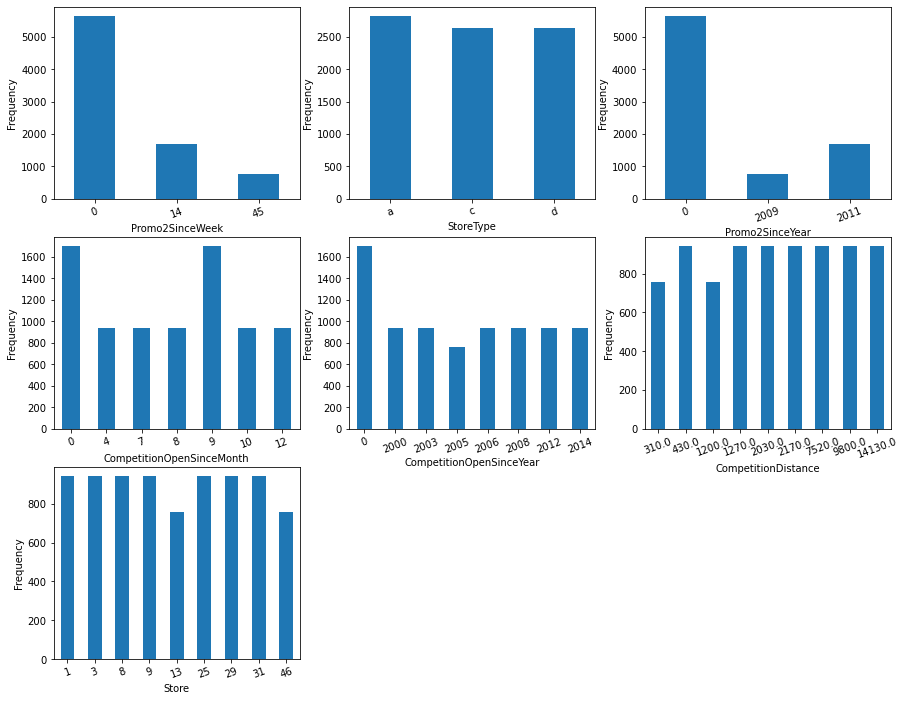

In [19]:
unq_df = get_unique_vals()
discrete_cols = unq_df[(unq_df['Unique_values'] > 2) & (unq_df['Unique_values'] < 10)].Column.values
num_discrete_cols = len(discrete_cols)
n_rows = int(np.ceil(num_discrete_cols/3))
n_cols = 3

plt.figure(figsize=(15,12))
for i, discrete_col in enumerate(discrete_cols):
    plt.subplot(n_rows, n_cols, i+1)
    data.groupby(discrete_col)['Sales'].count().plot.bar()
    plt.xticks(rotation=20)
    plt.xlabel(discrete_col)
    plt.ylabel('Frequency')
plt.show()

**Observations:**
- Promo2SinceWeek: The promotions decreases later the year when compared to first half of the year.
- Promo2SinceYear: The promotions in 2011 > 2009.
- The frequency of the data for other columns are almost uniformly distributed.

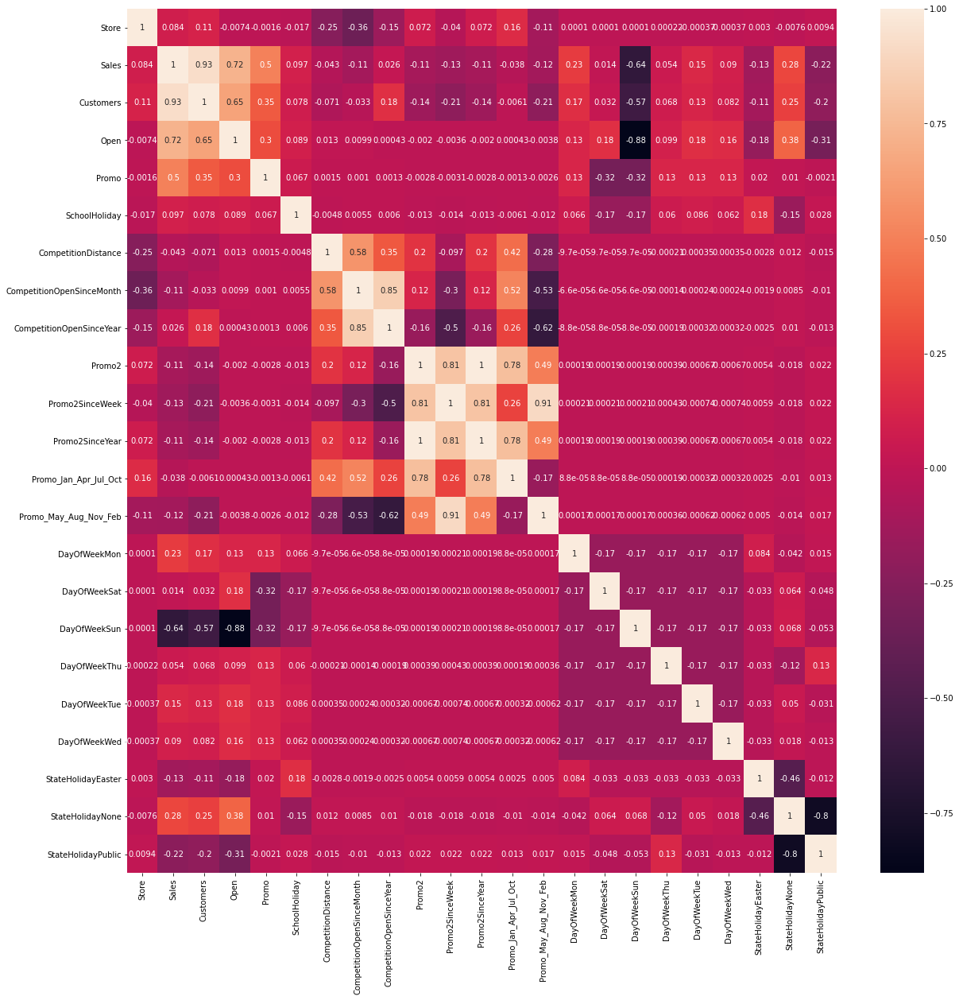

In [20]:
# Check for correlations
plt.figure(figsize=(20,20))
sns.heatmap(data.corr(), annot=True)
plt.show()

In [21]:
# Promo2 and Promo2SinceYear columns are 100% correlated.
# Hence, removing Promo2 column since Promo2SinceYear has more variance.
data.drop('Promo2', axis=1, inplace=True)

#### Removing irrelevant columns

In [22]:
data.drop(['CompetitionDistance', 'StoreType', 'Assortment'], axis=1, inplace=True)

#### Outlier treatment

In [23]:
# Check the descriptive statistics of continuous variables
data[['Sales', 'Customers']].describe(percentiles=(.5,.75,.9,.95,.99))

,Sales,Customers
count,8110.000000,8110.000000
mean,5394.031566,590.330210
std,3455.976814,421.269874
min,0.000000,0.000000
50%,5406.000000,573.000000
75%,7252.500000,720.000000
90%,9536.100000,1007.000000
95%,11377.700000,1521.550000
99%,14810.280000,1929.910000
max,24882.000000,2835.000000


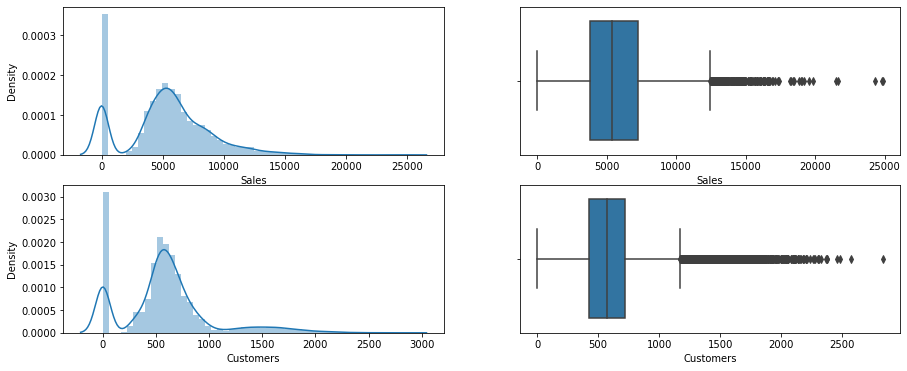

In [24]:
# Check the distribution for continuous variables before removing outliers.
plt.figure(figsize=(15,6))
plt.subplot(221)
sns.distplot(data['Sales'], kde=True)
plt.subplot(222)
sns.boxplot(data['Sales'])
plt.subplot(223)
sns.distplot(data['Customers'], kde=True)
plt.subplot(224)
sns.boxplot(data['Customers'])
plt.show()

#### NOTE: 
- We shouldn't remove the outliers for the entire dataset at once because every store has it's own sales data considering the amount of customers visiting it. Ex: If a store is on the main road, we can expect more number of customers and the sales to be high when compared to store that is located remotely.

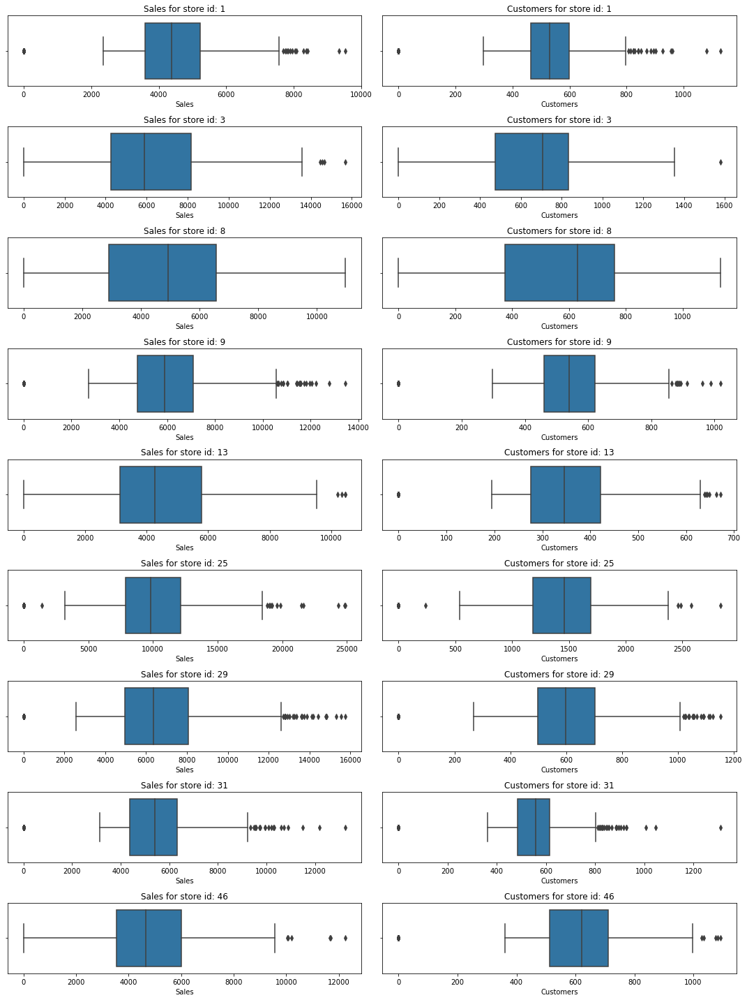

In [25]:
plt.figure(figsize=(15,20), tight_layout=True)
for index, store_id in enumerate(stores_selected):
    store_df = data[data.Store == store_id]
    exec(f'store_{store_id} = data[data.Store == {store_id}]')
    plt.subplot(9, 2, index * 2 + 1)
    plt.title(f'Sales for store id: {store_id}')
    sns.boxplot(store_df['Sales'])
    plt.subplot(9, 2, index * 2 + 2)
    plt.title(f'Customers for store id: {store_id}')
    sns.boxplot(store_df['Customers'])
plt.show()

**Observations:**
- Looking at the individual store's distribution, it is clear that we have to handle outliers seperately.

In [26]:
# Removing extreme outliers for Sales column individually for every store
store_1 = store_1[store_1['Sales'] < store_1['Sales'].quantile(.99)]
store_3 = store_3[store_3['Sales'] < store_3['Sales'].quantile(.99)]
store_9 = store_9[store_9['Sales'] < store_9['Sales'].quantile(.99)]
store_13 = store_13[store_13['Sales'] < store_13['Sales'].quantile(.99)]
store_25 = store_25[store_25['Sales'] < store_25['Sales'].quantile(.99)]
store_29 = store_29[store_29['Sales'] < store_29['Sales'].quantile(.99)]
store_31 = store_31[store_31['Sales'] < store_31['Sales'].quantile(.99)]
store_46 = store_46[store_46['Sales'] < store_46['Sales'].quantile(.99)]

In [27]:
# Removing extreme outliers for Customers column individually for every store
store_1 = store_1[store_1['Customers'] < store_1['Customers'].quantile(.99)]
store_9 = store_9[store_9['Customers'] < store_9['Customers'].quantile(.99)]
store_13 = store_13[store_13['Customers'] < store_13['Customers'].quantile(.99)]
store_25 = store_25[store_25['Customers'] < store_25['Customers'].quantile(.99)]
store_29 = store_29[store_29['Customers'] < store_29['Customers'].quantile(.99)]
store_31 = store_31[store_31['Customers'] < store_31['Customers'].quantile(.99)]
store_46 = store_46[store_46['Customers'] < store_46['Customers'].quantile(.99)]

In [28]:
data = pd.concat([store_1, store_3, store_8, store_9, store_13, store_25, store_29,
           store_31, store_46])

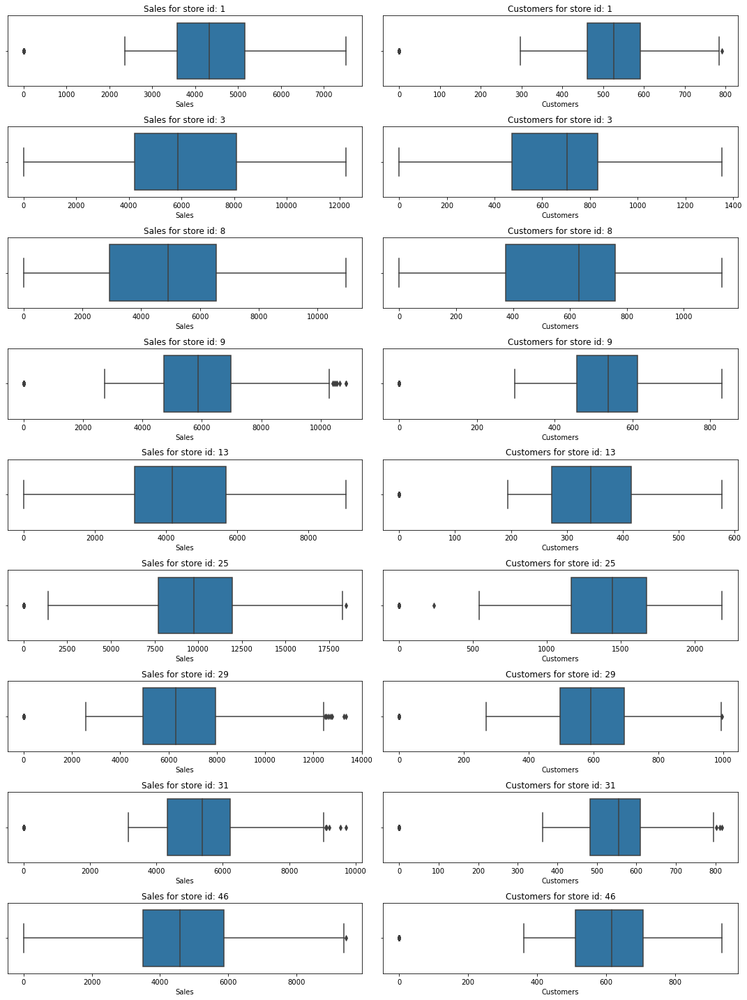

In [29]:
# Visualise the data after removing outliers
plt.figure(figsize=(15,20), tight_layout=True)
for index, store_id in enumerate(stores_selected):
    store_df = data[data.Store == store_id]
    exec(f'store_{store_id} = data[data.Store == {store_id}]')
    plt.subplot(9, 2, index * 2 + 1)
    plt.title(f'Sales for store id: {store_id}')
    sns.boxplot(store_df['Sales'])
    plt.subplot(9, 2, index * 2 + 2)
    plt.title(f'Customers for store id: {store_id}')
    sns.boxplot(store_df['Customers'])
plt.show()

**Observations:**
- After removing outliers, we found both "Sales" and "Customers" variables are right skewed.
- To remove skewness, apply log transform to Sales and Customers variables.
- Since both the variables have significant zero values, add 1 to both the variables before taking log to avoid log(0) which is -infinity.

In [30]:
# Log transform is same as applying boxcox transform with lambda 0.
data_log = data.copy()
data_log['Sales'] = np.log(data_log['Sales'] + 1)
data_log['Customers'] = np.log(data_log['Customers'] + 1)

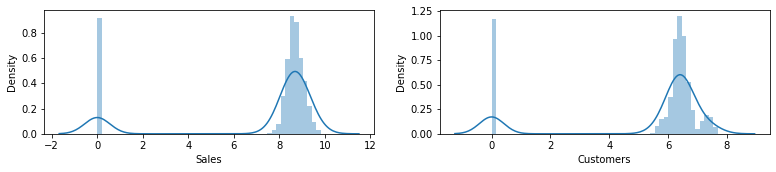

In [31]:
plt.figure(figsize=(13,5))
plt.subplot(221)
sns.distplot(data_log['Sales'], kde=True)
plt.subplot(222)
sns.distplot(data_log['Customers'], kde=True)
plt.show()

**Observations:**
- To remove skewness, log transform is performed on both of these variables.
- After applying log transform, we get bimodal normal distribution since we have significant amount of data points having zero values.

### Perform stationarity tests to determine if the series is stationary or not
- Augmented Dickey Fuller (ADF) Test
    - H0: The series is not stationary.
    - H1: The series is stationary.
- KPSS test
    - H0: The series is stationary.
    - H1: The series is not stationary.

In [32]:
# @method: stationarity_test: Define a method to test the stationarity of the time series data.
def stationarity_test(stationarity_df, col_name, series, sig=0.05):
    adf_result = adfuller(series)
    adf_p_value = adf_result[1]
    kpss_result = kpss(series)
    kpss_p_value = kpss_result[1]
    return stationarity_df.append({
        'Column': col_name,
        'ADF p-value': adf_p_value,
        'ADF Result': 'stationary' if adf_p_value <= sig else 'not stationary',
        'KPSS p-value': kpss_p_value,
        'KPSS Result': 'not stationary' if kpss_p_value <= sig else 'stationary'
    }, ignore_index=True)

# @method: get_stationarity_res: A utility method to create a dataframe tracking the relevant parameters.
def get_stationarity_res(df):
    stationarity_df = pd.DataFrame(columns=['Column', 'ADF p-value', 'ADF Result', 'KPSS p-value', 'KPSS Result'])
    for col_name, series in df.iteritems():
        stationarity_df = stationarity_test(stationarity_df, col_name, series)
    return stationarity_df

#### @method: `evaluate_model` Define a method to track the model evaluation metrics
- Since our data contains zero values, MAPE metric is not a good measure. Below hyperlink is the reference that explains why we shouldn't use MAPE when we have zero values.
- https://stats.stackexchange.com/questions/299712/what-are-the-shortcomings-of-the-mean-absolute-percentage-error-mape

In [33]:
model_eval_df = pd.DataFrame(columns=['Store ID', 'Model Type', 'RMSE', 'MAE'])
def evaluate_model(store_id, model_type, y_test_true, y_test_pred):
    global model_eval_df
    rmse = mean_squared_error(y_test_true['Sales'], y_test_pred[y_test_true.index.min():], squared=False)
    mae = mean_absolute_error(y_test_true['Sales'], y_test_pred[y_test_true.index.min():])
    model_eval_df = model_eval_df.append({
        'Store ID': store_id,
        'Model Type': model_type,
        'RMSE': round(rmse, 2),
        'MAE': round(mae, 2)
    }, ignore_index=True)
    return model_eval_df[model_eval_df['Store ID'] == store_id]

#### @method: `cointegration_test`: Check if `Sales` and `Customers` time series are cointegrated
- Calculate cointegration rank.
- If rank = 2, then both the series are not cointegrated but they are stationary and we can build VAR/VARMAX models.
- If rank = 1, then both the series are cointegrated. Since these are cointegrated, we can build VAR/VARMAX models.
- If rank = 0, then there is no cointegrating vector and hence we cannot build VAR/VARMAX models.

In [34]:
def cointegration_test(df, alpha=0.05):
    rank_res = select_coint_rank(store_1[['Sales', 'Customers']], det_order=-1, k_ar_diff=1)
    print('Time series are stationary/cointegrated.' if rank_res.rank > 0 else 'Time series are not cointegrated.')

### Step 3: Model Building and visualization

# `Store 1` Time Series Analysis

In [35]:
# Remove columns having only 1 unique value. These columns don't have variance and won't contribute while modelling.
cols_to_remove = [col for col in store_1.columns if store_1[col].nunique() <= 1]
store_1.drop(cols_to_remove, inplace=True, axis=1)
store_1.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeekMon,DayOfWeekSat,DayOfWeekSun,DayOfWeekThu,DayOfWeekTue,DayOfWeekWed,StateHolidayEaster,StateHolidayNone,StateHolidayPublic
Date,,,,,,,,,,,,,,
2013-01-01,0,0,0,0,1,0,0,0,0,1,0,0,0,1
2013-01-02,5530,668,1,0,1,0,0,0,0,0,1,0,1,0
2013-01-03,4327,578,1,0,1,0,0,0,1,0,0,0,1,0
2013-01-04,4486,619,1,0,1,0,0,0,0,0,0,0,1,0
2013-01-05,4997,635,1,0,1,0,1,0,0,0,0,0,1,0


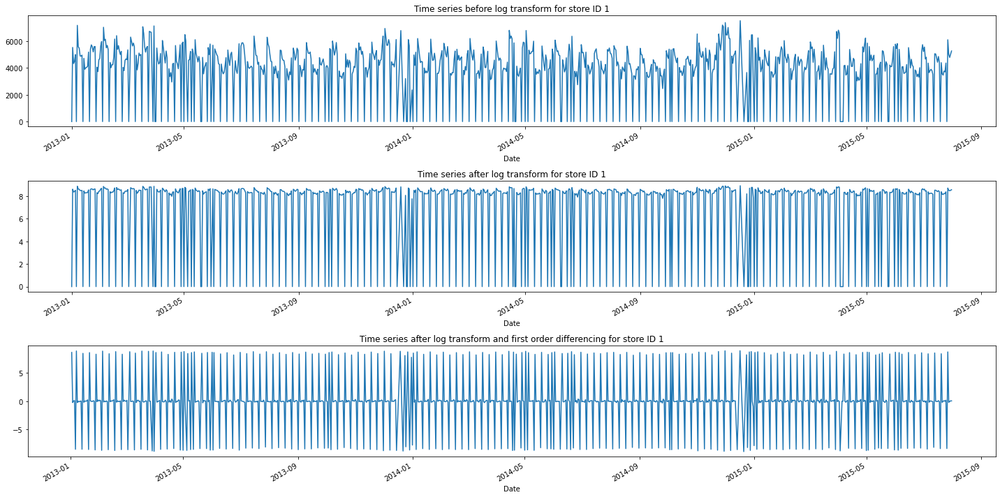

In [36]:
# Visualise the time series data for Store 1.
store_id = 1
store_1_log = data_log[data_log.Store == store_id]
store_1_log_diff = store_1_log.diff().dropna()

plt.figure(figsize=(20,10), tight_layout=True)
plt.subplot(311)
data[data.Store == store_id]['Sales'].plot()
plt.title(f'Time series before log transform for store ID {store_id}')
plt.subplot(312)
store_1_log['Sales'].plot()
plt.title(f'Time series after log transform for store ID {store_id}')
plt.subplot(313)
store_1_log_diff['Sales'].plot()
plt.title(f'Time series after log transform and first order differencing for store ID {store_id}')
plt.show()

**Observations:**
- The variance and mean is constant after performing log transform even without first order differencing.
- Let's test the stationarity of the series after performing log transform. If the series is not yet stationary, then let's do first order differencing.

In [37]:
get_stationarity_res(store_1[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,6.907916e-08,stationary,0.049337,not stationary
1,Customers,4.320718e-05,stationary,0.010000,not stationary


In [38]:
get_stationarity_res(store_1_log[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,7.284999e-08,stationary,0.1,stationary
1,Customers,8.247291e-08,stationary,0.1,stationary


**Observations:**
- After applying log transform, the time series is stationary. The differencing is not required for this series.

#### Stratified train and test split datasets
- Split 80% train and 20% test data respectively.
- Differencing is not considered for store 1's time series data.

In [39]:
train_len = int(len(store_1) * 0.8)
train_1 = store_1[:train_len]
test_1 = store_1[train_len:]

train_1_log = store_1_log[:train_len]
test_1_log = store_1_log[train_len:]

#### Plot ACF and PACF to determine non-seasonal p and q values

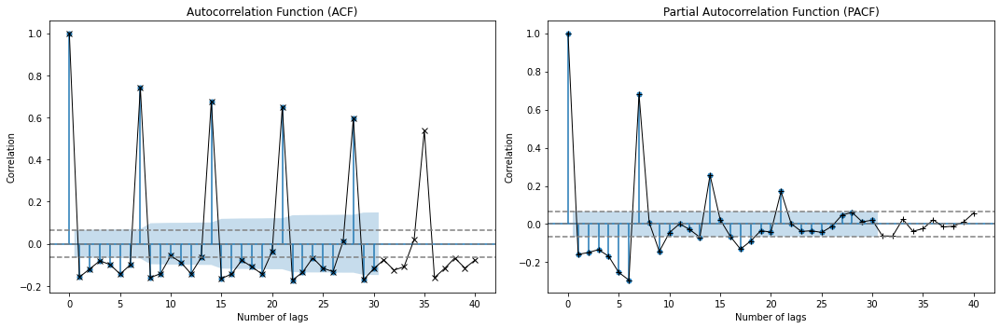

In [40]:
y=store_1_log['Sales']
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

#### Plot ACF and PACF to determine seasonal p and q values

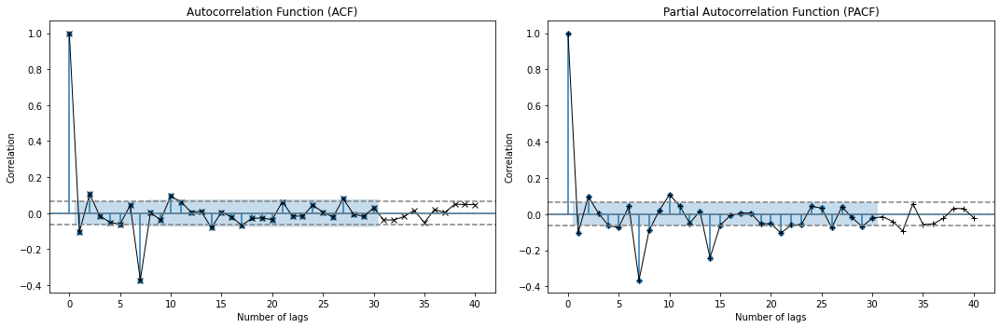

In [41]:
y=store_1_log['Sales'].diff(7).dropna() #store data is showing weekly trend
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

### Model 1: SARIMA Model for Store 1

In [42]:
sarima_model_1 = SARIMAX(train_1_log['Sales'], order=(1,1,1), seasonal_order=(1,1,1,7))
sarima_model_1_fit = sarima_model_1.fit()
print(sarima_model_1_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  737
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood               -1550.379
Date:                           Tue, 22 Feb 2022   AIC                           3110.757
Time:                                   13:57:32   BIC                           3133.716
Sample:                                        0   HQIC                          3119.615
                                           - 737                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1578      0.020     -7.764      0.000      -0.198      -0.118
ma.L1         -0.9999      0.327     -3.056

#### Recover original time series

In [43]:
y_hat_sarima = store_1_log.copy()
y_hat_sarima['sarima_forecast_log'] = sarima_model_1_fit.predict(store_1_log.index.min(), len(store_1_log)-1).values
y_hat_sarima['sarima_forecast'] = np.exp(y_hat_sarima['sarima_forecast_log'])

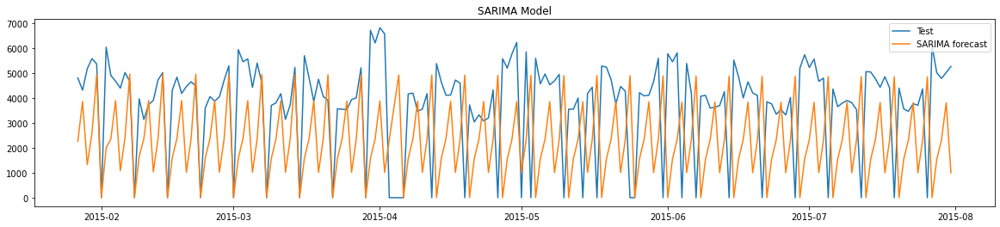

In [44]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_1['Sales'], label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test_1.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Forecasting for the next 6 weeks

In [45]:
# Create a series to forecast for the next 6 weeks.
six_weeks_range = pd.date_range(store_1_log.index.max(), periods=42)
num_of_days = len(train_1_log) + (pd.to_datetime(six_weeks_range[-1]) - train_1_log.index.max()).days - 1
date_range = pd.date_range(train_1_log.index.max(), six_weeks_range[-1])
six_week_forecast = pd.Series(sarima_model_1_fit.predict(train_1_log.index.max(), num_of_days).values, index=date_range)
six_week_forecast = np.exp(six_week_forecast)

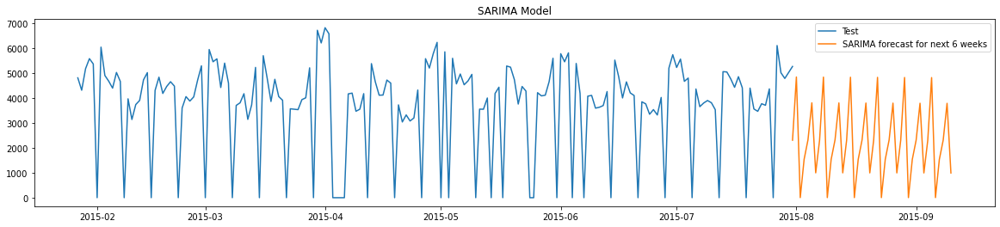

In [46]:
plt.figure(figsize=(20,4))
plt.plot(test_1['Sales'], label='Test')
plt.plot(six_week_forecast[test_1.index.max():], label='SARIMA forecast for next 6 weeks')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Model Evaluation

In [47]:
evaluate_model('1', 'SARIMA (1, 1, 1)x(1, 1, 1, 7)', test_1, y_hat_sarima['sarima_forecast'])

,Store ID,Model Type,RMSE,MAE
0,1,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",2995.12,2506.06


### Model 2: SARIMAX Model for Store 1
- To forecast for the next 6 weeks from the last date in dataset, exogenous variable data for the next 6 weeks should be available. Since this is not available, we will try to forecast the Sales within the available data.

In [48]:
exog = train_1_log.drop(['Sales', 'Customers'], axis=1).columns
sarimax_model_1 = SARIMAX(train_1_log['Sales'], exog=train_1_log[exog], order=(1,1,1), seasonal_order=(1,1,1,7))
sarimax_model_1_fit = sarimax_model_1.fit()
print(sarimax_model_1_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  737
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood                 546.132
Date:                           Tue, 22 Feb 2022   AIC                          -1044.264
Time:                                   13:57:43   BIC                           -934.064
Sample:                                        0   HQIC                         -1001.745
                                           - 737                                         
Covariance Type:                             opg                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Store                     -1.779e-08      2.111  -8.43e-09      1.000      -4.138       4.13

#### Recover original time series

In [49]:
y_hat_sarimax = store_1_log.copy()
y_hat_sarimax['sarimax_forecast_log'] = sarimax_model_1_fit.predict(store_1_log.index.min(), len(store_1_log)-1, exog=test_1_log[exog]).values
y_hat_sarimax['sarimax_forecast'] = np.exp(y_hat_sarimax['sarimax_forecast_log'])

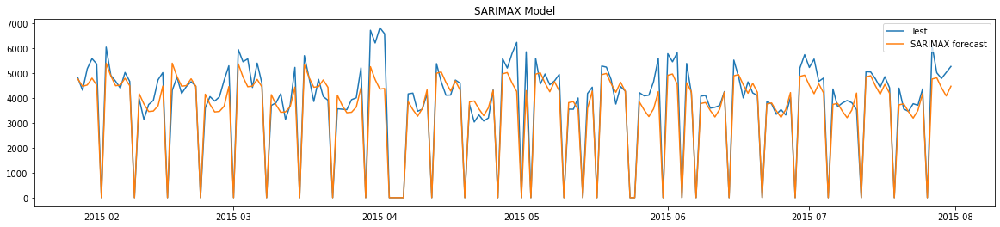

In [50]:
plt.figure(figsize=(20,4))
plt.plot(test_1['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test_1.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX Model')
plt.show()

#### Model Evaluation

In [51]:
evaluate_model('1', 'SARIMAX (1, 1, 1)x(1, 1, 1, 7)', test_1, y_hat_sarimax['sarimax_forecast'])

,Store ID,Model Type,RMSE,MAE
0,1,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",2995.12,2506.06
1,1,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",577.33,390.19


### Model 3: VAR Model for Store 1

In [52]:
# Check for cointegration. If time is cointegrated/stationary, then we can proceed with building VAR/VARMAX models.
cointegration_test(store_1_log)

Time series are stationary/cointegrated.


In [53]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VAR model
var_model_1 = sm.tsa.VARMAX(train_1_log[['Sales', 'Customers']], order=(1, 0))
var_model_1_fit = var_model_1.fit(maxiter=1000, disp=False)
var_model_1_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,737
Model:,VAR(1),Log Likelihood,-644.957
,+ intercept,AIC,1307.914
Date:,"Tue, 22 Feb 2022",BIC,1349.338
Time:,13:57:46,HQIC,1323.889
Sample:,0,,
,- 737,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.11, 5.73",Jarque-Bera (JB):,"321.28, 0.34"
Prob(Q):,"0.75, 0.02",Prob(JB):,"0.00, 0.84"
Heteroskedasticity (H):,"1.02, 1.11",Skew:,"-1.57, 0.04"


#### Recover original time series

In [54]:
y_hat_var = store_1_log.copy()
predictions = var_model_1_fit.predict(store_1_log.index.min(), len(store_1_log) - 1)
predictions['Date'] = store_1_log.index
predictions.set_index('Date', inplace=True)
y_hat_var[['Sales', 'Customers']] = predictions
y_hat_var[['Sales', 'Customers']] = np.exp(y_hat_var[['Sales', 'Customers']])

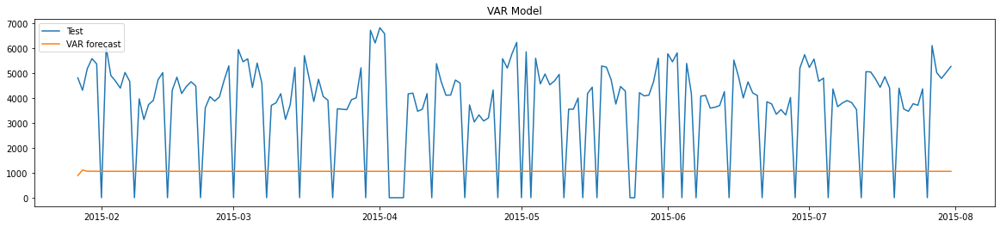

In [55]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_1['Sales'], label='Test')
plt.plot(y_hat_var['Sales'][test_1.index.min():], label='VAR forecast')
plt.legend(loc='upper left')
plt.title('VAR Model')
plt.show()

In [56]:
evaluate_model('1', 'VAR (1, 0)', test_1, y_hat_var['Sales'])

,Store ID,Model Type,RMSE,MAE
0,1,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",2995.12,2506.06
1,1,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",577.33,390.19
2,1,"VAR (1, 0)",3261.75,3045.18


### Model 4: VARMAX Model for Store 1

In [57]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VARMAX model
exog = train_1_log.drop(['Sales', 'Customers'], axis=1).columns
varmax_model_1 = sm.tsa.VARMAX(train_1_log[['Sales', 'Customers']], order=(1, 1), exog=train_1_log[exog])
varmax_model_1_fit = varmax_model_1.fit(maxiter=1000, disp=False)
varmax_model_1_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,737
Model:,"VARMAX(1,1)",Log Likelihood,-106050.908
,+ intercept,AIC,212203.816
Date:,"Tue, 22 Feb 2022",BIC,212438.548
Time:,13:58:50,HQIC,212294.337
Sample:,0,,
,- 737,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"168.85, 119.28",Jarque-Bera (JB):,"9.17, 27.05"
Prob(Q):,"0.00, 0.00",Prob(JB):,"0.01, 0.00"
Heteroskedasticity (H):,"0.97, 0.93",Skew:,"-0.24, -0.47"


#### Recover original time series

In [58]:
y_hat_varmax = store_1_log.copy()
predictions = varmax_model_1_fit.predict(store_1_log.index.min(), len(store_1_log) - 1, exog=test_1_log[exog])
predictions['Date'] = store_1_log.index
predictions.set_index('Date', inplace=True)
y_hat_varmax[['Sales', 'Customers']] = predictions
y_hat_varmax[['Sales', 'Customers']] = np.exp(y_hat_varmax[['Sales', 'Customers']])

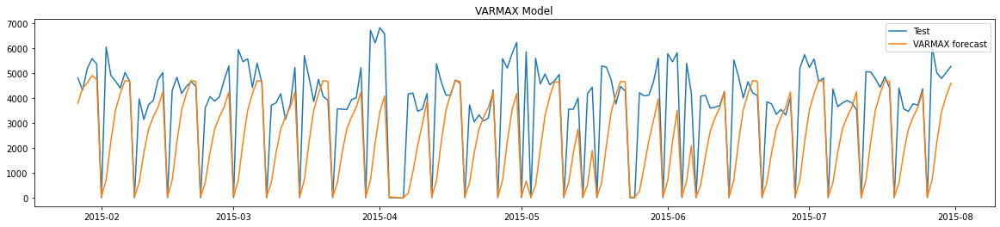

In [59]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_1['Sales'], label='Test')
plt.plot(y_hat_varmax['Sales'][test_1.index.min():], label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX Model')
plt.show()

In [60]:
evaluate_model('1', 'VARMAX (1, 1)', test_1, y_hat_varmax['Sales'])

,Store ID,Model Type,RMSE,MAE
0,1,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",2995.12,2506.06
1,1,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",577.33,390.19
2,1,"VAR (1, 0)",3261.75,3045.18
3,1,"VARMAX (1, 1)",2103.83,1420.58


**Observations:**
- SARIMAX model is better for store 1 series when compared to other 3 models.

# `Store 3` Time Series Analysis

In [61]:
# Remove columns having only 1 unique value. These columns don't have variance and won't contribute while modelling.
cols_to_remove = [col for col in store_3.columns if store_3[col].nunique() <= 1]
store_3.drop(cols_to_remove, inplace=True, axis=1)
store_3.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeekMon,DayOfWeekSat,DayOfWeekSun,DayOfWeekThu,DayOfWeekTue,DayOfWeekWed,StateHolidayEaster,StateHolidayNone,StateHolidayPublic
Date,,,,,,,,,,,,,,
2013-01-01,0,0,0,0,1,0,0,0,0,1,0,0,0,1
2013-01-02,6823,805,1,0,1,0,0,0,0,0,1,0,1,0
2013-01-03,5902,721,1,0,1,0,0,0,1,0,0,0,1,0
2013-01-04,6069,690,1,0,1,0,0,0,0,0,0,0,1,0
2013-01-05,4523,525,1,0,0,0,1,0,0,0,0,0,1,0


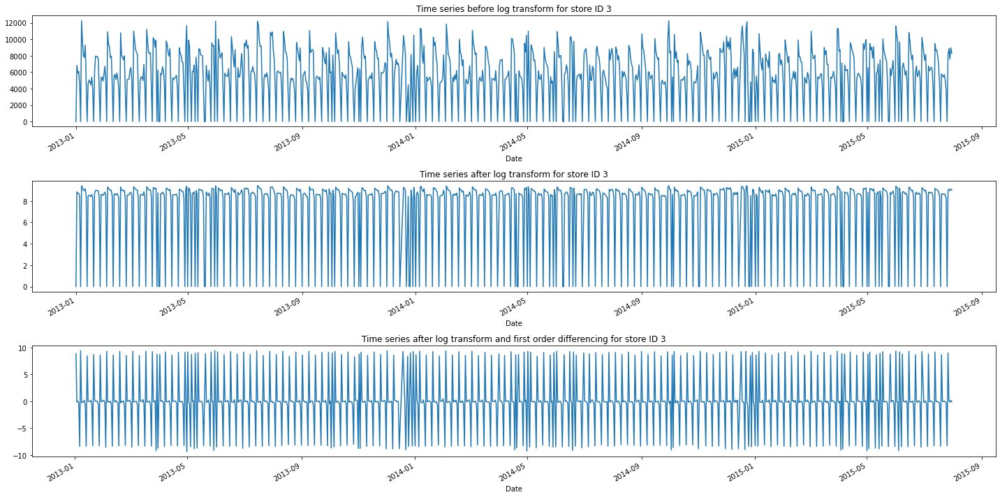

In [62]:
# Visualise the time series data for Store 3.
store_id = 3
store_3_log = data_log[data_log.Store == store_id]
store_3_log_diff = store_3_log.diff().dropna()

plt.figure(figsize=(20,10), tight_layout=True)
plt.subplot(311)
store_3['Sales'].plot()
plt.title(f'Time series before log transform for store ID {store_id}')

plt.subplot(312)
store_3_log['Sales'].plot()
plt.title(f'Time series after log transform for store ID {store_id}')

plt.subplot(313)
store_3_log_diff['Sales'].plot()
plt.title(f'Time series after log transform and first order differencing for store ID {store_id}')
plt.show()

**Observations:**
- The variance and mean is constant after performing log transform even without first order differencing.
- Let's test the stationarity of the series before performing log transform. If the series is not yet stationary, then let's do log transformtion followed by first order differencing.

In [63]:
get_stationarity_res(store_3[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,1.277020e-09,stationary,0.100000,stationary
1,Customers,4.587358e-08,stationary,0.080259,stationary


**Observations:**
- For this time series, the differencing and log transformation is not even required since the time series is already stationary.

#### Stratified train and test split datasets
- Split 80% train and 20% test data respectively.
- Differencing and transformation are not considered for store 3's time series data.

In [64]:
train_len = int(len(store_3) * 0.8)
train_3 = store_3[:train_len]
test_3 = store_3[train_len:]

train_3_log = store_3_log[:train_len]
test_3_log = store_3_log[train_len:]

#### Plot ACF and PACF to determine non-seasonal p and q values

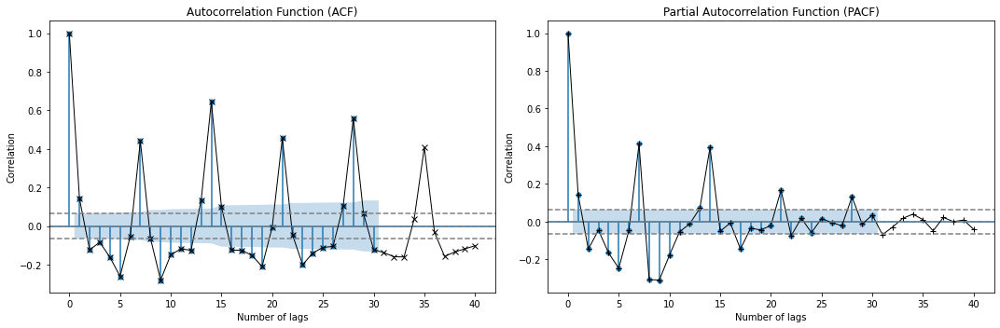

In [65]:
y=store_3['Sales']
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

#### Plot ACF and PACF to determine seasonal p and q values

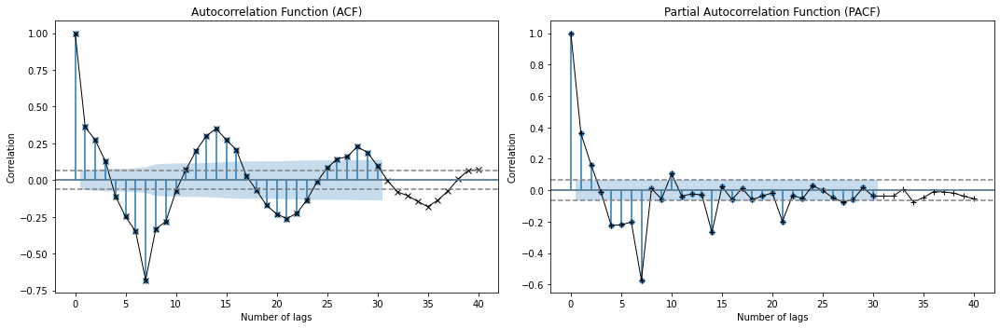

In [66]:
y=store_3['Sales'].diff(7).dropna() #store data is showing weekly trend
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

### Model 1: SARIMA Model for Store 3

In [67]:
sarima_model_3 = SARIMAX(train_3['Sales'], order=(1,0,1), seasonal_order=(2,1,2,7))
sarima_model_3_fit = sarima_model_3.fit()
print(sarima_model_3_fit.summary())

                                       SARIMAX Results                                        
Dep. Variable:                                  Sales   No. Observations:                  745
Model:             SARIMAX(1, 0, 1)x(2, 1, [1, 2], 7)   Log Likelihood               -6777.471
Date:                                Tue, 22 Feb 2022   AIC                          13568.942
Time:                                        13:58:59   BIC                          13601.170
Sample:                                             0   HQIC                         13581.369
                                                - 745                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4475      0.100      4.460      0.000       0.251       0.644
ma.

#### Recover original time series

In [68]:
y_hat_sarima_3 = store_3.copy()
y_hat_sarima_3['sarima_forecast'] = sarima_model_3_fit.predict(store_3.index.min(), len(store_3)-1).values

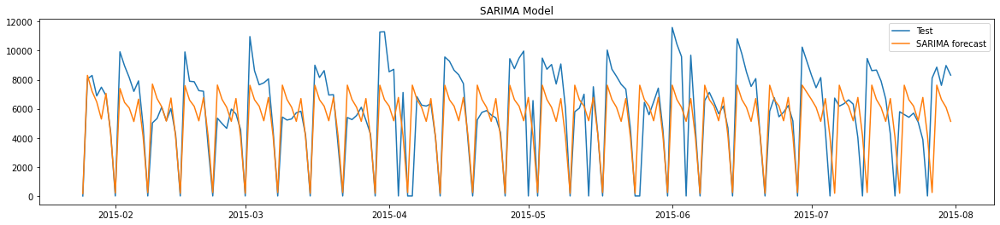

In [69]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_3['Sales'], label='Test')
plt.plot(y_hat_sarima_3['sarima_forecast'][test_3.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Forecasting for the next 6 weeks

In [70]:
# Create a series to forecast for the next 6 weeks.
six_weeks_range = pd.date_range(store_3.index.max(), periods=42)
num_of_days = len(train_3) + (pd.to_datetime(six_weeks_range[-1]) - train_3.index.max()).days - 1
date_range = pd.date_range(train_3.index.max(), six_weeks_range[-1])
six_week_forecast = pd.Series(sarima_model_3_fit.predict(train_3.index.max(), num_of_days).values, index=date_range)

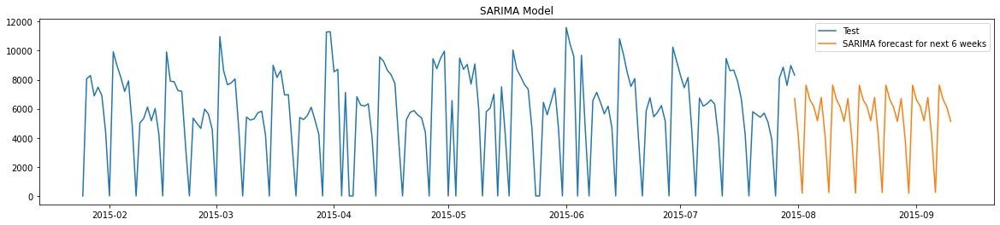

In [71]:
plt.figure(figsize=(20,4))
plt.plot(test_3['Sales'], label='Test')
plt.plot(six_week_forecast[test_3.index.max():], label='SARIMA forecast for next 6 weeks')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Model Evaluation

In [72]:
evaluate_model('3', 'SARIMA (1, 0, 1)x(2, 1, 2, 7)', test_3, y_hat_sarima_3['sarima_forecast'])

,Store ID,Model Type,RMSE,MAE
4,3,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2389.38,1693.64


### Model 2: SARIMAX Model for Store 3
- To forecast for the next 6 weeks from the last date in dataset, exogenous variable data for the next 6 weeks should be available. Since this is not available, we will try to forecast the Sales within the available data.

In [73]:
# Using all variables as exogenious variables except for sales and customers
exog = train_3.drop(['Sales', 'Customers'], axis=1).columns
sarimax_model_3 = SARIMAX(train_3['Sales'], exog=train_3[exog], order=(1,0,1), seasonal_order=(2,1,2,7))
sarimax_model_3_fit = sarimax_model_3.fit()
print(sarimax_model_3_fit.summary())

                                       SARIMAX Results                                        
Dep. Variable:                                  Sales   No. Observations:                  745
Model:             SARIMAX(1, 0, 1)x(2, 1, [1, 2], 7)   Log Likelihood               -6169.820
Date:                                Tue, 22 Feb 2022   AIC                          12377.640
Time:                                        13:59:17   BIC                          12465.115
Sample:                                             0   HQIC                         12411.371
                                                - 745                                         
Covariance Type:                                  opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Open                4864.6928    196.701     24.731      0.000    

#### Recover original time series

In [74]:
y_hat_sarimax_3 = store_3.copy()
y_hat_sarimax_3['sarimax_forecast'] = sarimax_model_3_fit.predict(store_3.index.min(), len(store_3)-1, exog=test_3[exog]).values

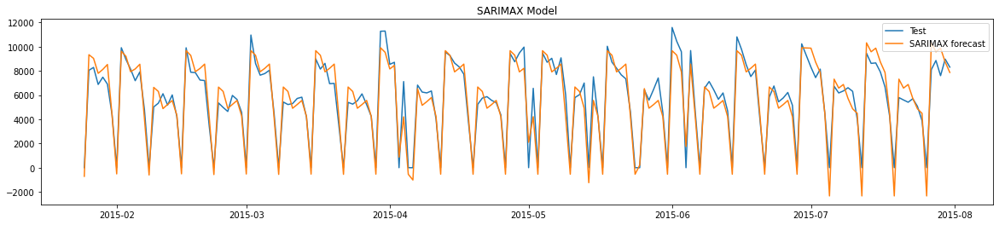

In [75]:
plt.figure(figsize=(20,4))
plt.plot(test_3['Sales'], label='Test')
plt.plot(y_hat_sarimax_3['sarimax_forecast'][test_3.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX Model')
plt.show()

#### Model Evaluation

In [76]:
evaluate_model('3', 'SARIMAX (1, 0, 1)x(2, 1, 2, 7)', test_3, y_hat_sarimax_3['sarimax_forecast'])

,Store ID,Model Type,RMSE,MAE
4,3,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2389.38,1693.64
5,3,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",988.78,798.15


### Model 3: VAR Model for Store 3

In [77]:
# Check for cointegration. If time is cointegrated/stationary, then we can proceed with building VAR/VARMAX models.
cointegration_test(store_3)

Time series are stationary/cointegrated.


In [78]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VAR model
var_model_3 = sm.tsa.VARMAX(train_3[['Sales', 'Customers']].astype('float'), order=(1, 0))
var_model_3_fit = var_model_3.fit(maxiter=1000, disp=False)
var_model_3_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,745
Model:,VAR(1),Log Likelihood,-11119.192
,+ intercept,AIC,22256.383
Date:,"Tue, 22 Feb 2022",BIC,22297.904
Time:,13:59:19,HQIC,22272.387
Sample:,0,,
,- 745,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.12, 0.64",Jarque-Bera (JB):,"64.42, 20.72"
Prob(Q):,"0.73, 0.42",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"0.94, 0.96",Skew:,"-0.71, 0.05"


#### Recover original time series

In [79]:
y_hat_var_3 = store_3.copy()
predictions = var_model_3_fit.predict(store_3.index.min(), len(store_3) - 1)
predictions['Date'] = store_3.index
predictions.set_index('Date', inplace=True)
y_hat_var_3[['Sales', 'Customers']] = predictions

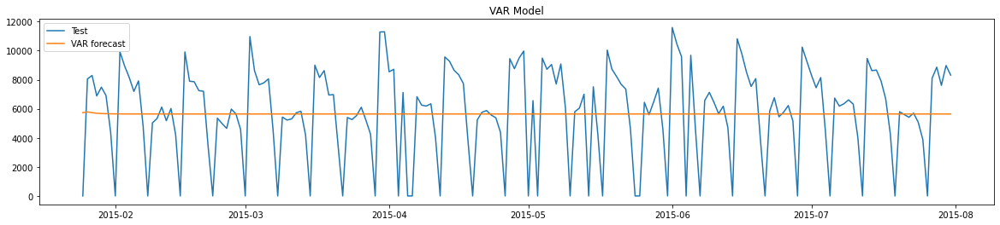

In [80]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_3['Sales'], label='Test')
plt.plot(y_hat_var_3['Sales'][test_3.index.min():], label='VAR forecast')
plt.legend(loc='upper left')
plt.title('VAR Model')
plt.show()

In [81]:
evaluate_model('3', 'VAR (1, 0)', test_3, y_hat_var_3['Sales'])

,Store ID,Model Type,RMSE,MAE
4,3,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2389.38,1693.64
5,3,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",988.78,798.15
6,3,"VAR (1, 0)",3149.09,2474.07


### Model 4: VARMAX Model for Store 3

In [82]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VARMAX model
exog = train_3.drop(['Sales', 'Customers'], axis=1).columns
varmax_model_3 = sm.tsa.VARMAX(train_3[['Sales', 'Customers']].astype('float'), order=(1, 1), exog=train_3[exog])
varmax_model_3_fit = varmax_model_3.fit(maxiter=1000, disp=False)
varmax_model_3_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,745
Model:,"VARMAX(1,1)",Log Likelihood,-10189.571
,+ intercept,AIC,20453.142
Date:,"Tue, 22 Feb 2022",BIC,20623.837
Time:,14:06:21,HQIC,20518.935
Sample:,0,,
,- 745,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.03, 3.82",Jarque-Bera (JB):,"424.95, 479.46"
Prob(Q):,"0.86, 0.05",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"1.00, 0.90",Skew:,"1.24, 0.08"


#### Recover original time series

In [83]:
y_hat_varmax_3 = store_3.copy()
predictions = varmax_model_3_fit.predict(store_3.index.min(), len(store_3) - 1, exog=test_3[exog])
predictions['Date'] = store_3.index
predictions.set_index('Date', inplace=True)
y_hat_varmax_3[['Sales', 'Customers']] = predictions

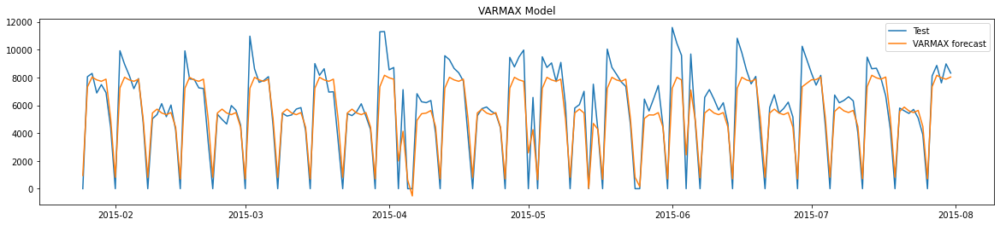

In [84]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_3['Sales'], label='Test')
plt.plot(y_hat_varmax_3['Sales'][test_3.index.min():], label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX Model')
plt.show()

In [85]:
evaluate_model('3', 'VARMAX (1, 1)', test_3, y_hat_varmax_3['Sales'])

,Store ID,Model Type,RMSE,MAE
4,3,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2389.38,1693.64
5,3,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",988.78,798.15
6,3,"VAR (1, 0)",3149.09,2474.07
7,3,"VARMAX (1, 1)",1206.45,873.18


**Observations:**
- SARIMAX model is better for store 3 series when compared to other 3 models.

# `Store 8` Time Series Analysis

In [86]:
# Remove columns having only 1 unique value. These columns don't have variance and won't contribute while modelling.
cols_to_remove = [col for col in store_8.columns if store_8[col].nunique() <= 1]
store_8.drop(cols_to_remove, inplace=True, axis=1)
store_8.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeekMon,DayOfWeekSat,DayOfWeekSun,DayOfWeekThu,DayOfWeekTue,DayOfWeekWed,StateHolidayEaster,StateHolidayNone,StateHolidayPublic
Date,,,,,,,,,,,,,,
2013-01-01,0,0,0,0,1,0,0,0,0,1,0,0,0,1
2013-01-02,5419,698,1,0,1,0,0,0,0,0,1,0,1,0
2013-01-03,4842,662,1,0,1,0,0,0,1,0,0,0,1,0
2013-01-04,4059,517,1,0,1,0,0,0,0,0,0,0,1,0
2013-01-05,2337,312,1,0,0,0,1,0,0,0,0,0,1,0


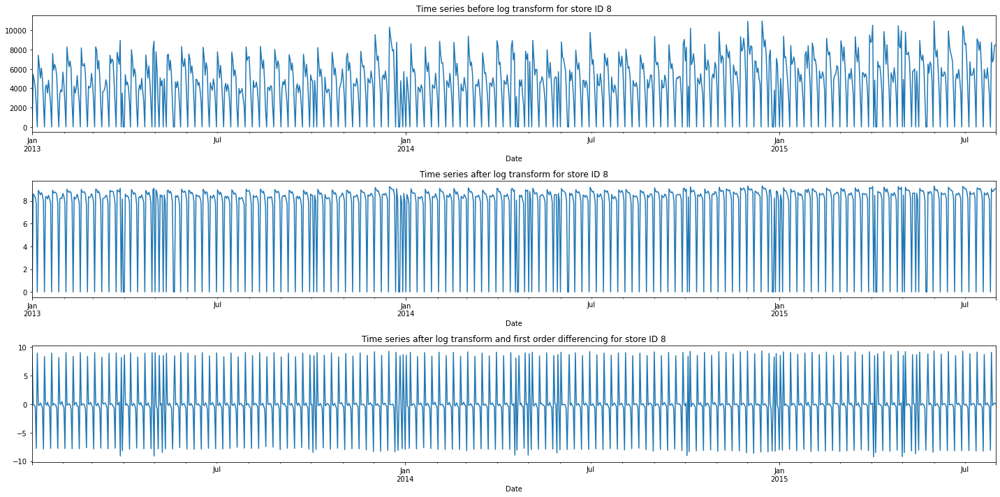

In [87]:
# Visualise the time series data for Store 8.
store_id = 8
store_8_log = data_log[data_log.Store == store_id]
store_8_log_diff = store_8_log.diff().dropna()

plt.figure(figsize=(20,10), tight_layout=True)
plt.subplot(311)
store_8['Sales'].plot()
plt.title(f'Time series before log transform for store ID {store_id}')

plt.subplot(312)
store_8_log['Sales'].plot()
plt.title(f'Time series after log transform for store ID {store_id}')

plt.subplot(313)
store_8_log_diff['Sales'].plot()
plt.title(f'Time series after log transform and first order differencing for store ID {store_id}')
plt.show()

**Observations:**
- The variance and mean is constant after performing log transform even without first order differencing.
- Let's test the stationarity of the series after performing log transform. If the series is not yet stationary, then let's do first order differencing.

In [88]:
get_stationarity_res(store_8[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,0.006445,stationary,0.01,not stationary
1,Customers,0.001462,stationary,0.01,not stationary


In [89]:
get_stationarity_res(store_8_log[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,5.646300e-08,stationary,0.1,stationary
1,Customers,6.710651e-08,stationary,0.1,stationary


**Observations:**
- After applying log transform, the time series is stationary. The differencing is not required for this series.

#### Stratified train and test split datasets
- Split 80% train and 20% test data respectively.
- Differencing is not considered for store 8's time series data.

In [90]:
train_len = int(len(store_8) * 0.8)
train_8 = store_8[:train_len]
test_8 = store_8[train_len:]

train_8_log = store_8_log[:train_len]
test_8_log = store_8_log[train_len:]

#### Plot ACF and PACF to determine non-seasonal p and q values

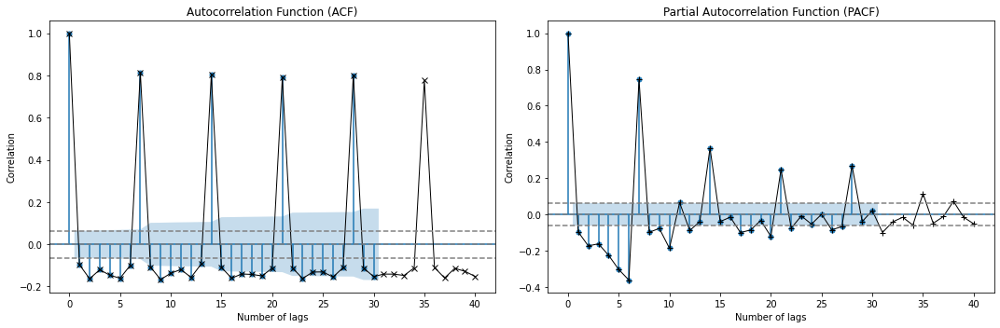

In [91]:
y=store_8_log['Sales']
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

#### Plot ACF and PACF to determine seasonal p and q values

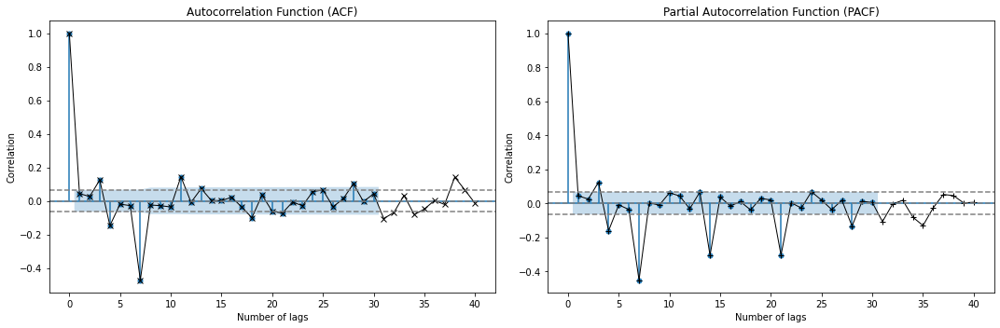

In [92]:
y=store_8_log['Sales'].diff(7).dropna() #store data is showing weekly trend
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

### Model 1: SARIMA Model for Store 8

In [93]:
sarima_model_8 = SARIMAX(train_8_log['Sales'], order=(1,1,1), seasonal_order=(1,1,1,7))
sarima_model_8_fit = sarima_model_8.fit()
print(sarima_model_8_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  753
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood               -1308.977
Date:                           Tue, 22 Feb 2022   AIC                           2627.954
Time:                                   14:06:28   BIC                           2651.021
Sample:                               01-01-2013   HQIC                          2636.845
                                    - 01-23-2015                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0948      0.020      4.712      0.000       0.055       0.134
ma.L1         -0.9998      0.268     -3.737

#### Recover original time series

In [94]:
y_hat_sarima_8 = store_8_log.copy()
y_hat_sarima_8['sarima_forecast_log'] = sarima_model_8_fit.predict(store_8_log.index.min(), len(store_8_log)-1).values
y_hat_sarima_8['sarima_forecast'] = np.exp(y_hat_sarima_8['sarima_forecast_log'])

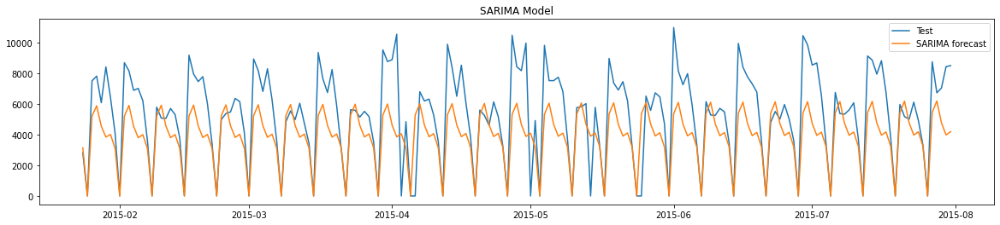

In [95]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_8['Sales'], label='Test')
plt.plot(y_hat_sarima_8['sarima_forecast'][test_8.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Forecasting for the next 6 weeks

In [96]:
# Create a series to forecast for the next 6 weeks.
six_weeks_range = pd.date_range(store_8_log.index.max(), periods=42)
num_of_days = len(train_8_log) + (pd.to_datetime(six_weeks_range[-1]) - train_8_log.index.max()).days - 1
date_range = pd.date_range(train_8_log.index.max(), six_weeks_range[-1])
six_week_forecast = pd.Series(sarima_model_8_fit.predict(train_8_log.index.max(), num_of_days).values, index=date_range)
six_week_forecast = np.exp(six_week_forecast)

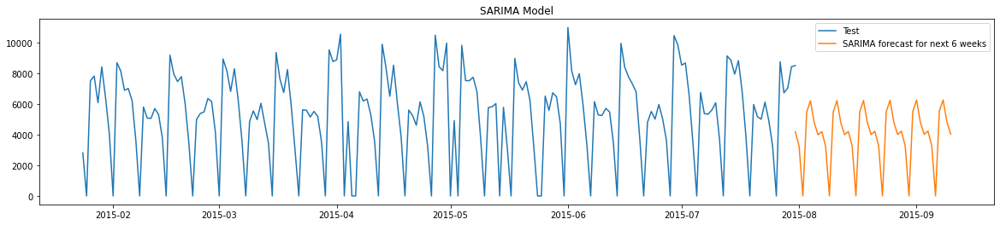

In [97]:
plt.figure(figsize=(20,4))
plt.plot(test_8['Sales'], label='Test')
plt.plot(six_week_forecast[test_8.index.max():], label='SARIMA forecast for next 6 weeks')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Model Evaluation

In [98]:
evaluate_model('8', 'SARIMA (1, 1, 1)x(1, 1, 1, 7)', test_8, y_hat_sarima_8['sarima_forecast'])

,Store ID,Model Type,RMSE,MAE
8,8,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",2365.81,1745.19


### Model 2: SARIMAX Model for Store 8
- To forecast for the next 6 weeks from the last date in dataset, exogenous variable data for the next 6 weeks should be available. Since this is not available, we will try to forecast the Sales within the available data.

In [99]:
# Using all variables as exogenious variables except for sales and customers
exog = train_8.drop(['Sales', 'Customers'], axis=1).columns
sarimax_model_8 = SARIMAX(train_8_log['Sales'], exog=train_8_log[exog], order=(1,1,1), seasonal_order=(1,1,1,7))
sarimax_model_8_fit = sarimax_model_8.fit()
print(sarimax_model_8_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  753
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood                 501.290
Date:                           Tue, 22 Feb 2022   AIC                           -968.581
Time:                                   14:06:38   BIC                           -890.153
Sample:                               01-01-2013   HQIC                          -938.352
                                    - 01-23-2015                                         
Covariance Type:                             opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Open                   4.2518      0.030    140.532      0.000       4.193       4.311
Promo              

#### Recover original time series

In [100]:
y_hat_sarimax_8 = store_8_log.copy()
y_hat_sarimax_8['sarimax_forecast_log'] = sarimax_model_8_fit.predict(store_8_log.index.min(), len(store_8_log)-1, exog=test_8_log[exog]).values
y_hat_sarimax_8['sarimax_forecast'] = np.exp(y_hat_sarimax_8['sarimax_forecast_log'])

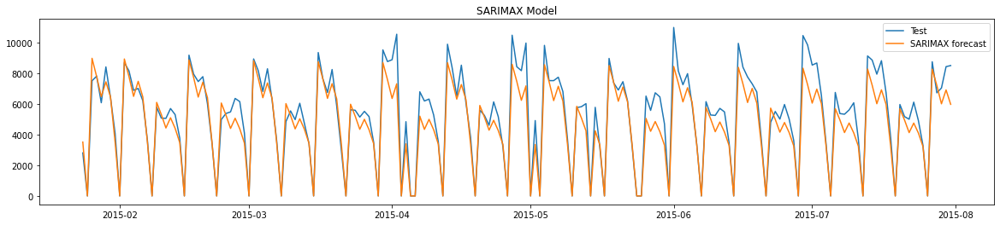

In [101]:
plt.figure(figsize=(20,4))
plt.plot(test_8['Sales'], label='Test')
plt.plot(y_hat_sarimax_8['sarimax_forecast'][test_8.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX Model')
plt.show()

#### Model Evaluation

In [102]:
evaluate_model('8', 'SARIMAX (1, 1, 1)x(1, 1, 1, 7)', test_8, y_hat_sarimax_8['sarimax_forecast'])

,Store ID,Model Type,RMSE,MAE
8,8,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",2365.81,1745.19
9,8,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",978.89,695.95


### Model 3: VAR Model for Store 8

In [103]:
# Check for cointegration. If time is cointegrated/stationary, then we can proceed with building VAR/VARMAX models.
cointegration_test(store_8_log)

Time series are stationary/cointegrated.


In [104]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VAR model
var_model_8 = sm.tsa.VARMAX(train_8_log[['Sales', 'Customers']].astype('float'), order=(1, 0))
var_model_8_fit = var_model_8.fit(maxiter=1000, disp=False)
var_model_8_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,753
Model:,VAR(1),Log Likelihood,-959.909
,+ intercept,AIC,1937.818
Date:,"Tue, 22 Feb 2022",BIC,1979.434
Time:,14:06:42,HQIC,1953.850
Sample:,01-01-2013,,
,- 01-23-2015,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.16, 0.11",Jarque-Bera (JB):,"181.45, 0.89"
Prob(Q):,"0.69, 0.75",Prob(JB):,"0.00, 0.64"
Heteroskedasticity (H):,"1.24, 0.70",Skew:,"-1.15, -0.06"


#### Recover original time series

In [105]:
y_hat_var_8 = store_8_log.copy()
predictions = var_model_8_fit.predict(store_8_log.index.min(), len(store_8_log) - 1)
predictions['Date'] = store_8_log.index
predictions.set_index('Date', inplace=True)
y_hat_var_8[['Sales', 'Customers']] = predictions
y_hat_var_8[['Sales', 'Customers']] = np.exp(y_hat_var_8[['Sales', 'Customers']])

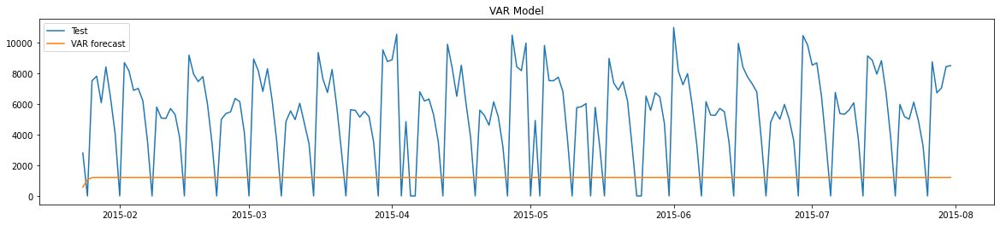

In [106]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_8['Sales'], label='Test')
plt.plot(y_hat_var_8['Sales'][test_8.index.min():], label='VAR forecast')
plt.legend(loc='upper left')
plt.title('VAR Model')
plt.show()

In [107]:
evaluate_model('8', 'VAR (1, 0)', test_8, y_hat_var_8['Sales'])

,Store ID,Model Type,RMSE,MAE
8,8,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",2365.81,1745.19
9,8,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",978.89,695.95
10,8,"VAR (1, 0)",5041.65,4499.37


### Model 4: VARMAX Model for Store 8

In [108]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VARMAX model
exog = train_8.drop(['Sales', 'Customers'], axis=1).columns
varmax_model_8 = sm.tsa.VARMAX(train_8_log[['Sales', 'Customers']].astype('float'), order=(1, 1), exog=train_8_log[exog])
varmax_model_8_fit = varmax_model_8.fit(maxiter=1000, disp=False)
varmax_model_8_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,753
Model:,"VARMAX(1,1)",Log Likelihood,812.039
,+ intercept,AIC,-1550.077
Date:,"Tue, 22 Feb 2022",BIC,-1378.987
Time:,14:12:02,HQIC,-1484.165
Sample:,01-01-2013,,
,- 01-23-2015,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"19.15, 2.56",Jarque-Bera (JB):,"459671.95, 616.37"
Prob(Q):,"0.00, 0.11",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"0.39, 0.99",Skew:,"-7.04, 0.03"


#### Recover original time series

In [109]:
y_hat_varmax_8 = store_8_log.copy()
predictions = varmax_model_8_fit.predict(store_8_log.index.min(), len(store_8_log) - 1, exog=test_8_log[exog])
predictions['Date'] = store_8_log.index
predictions.set_index('Date', inplace=True)
y_hat_varmax_8[['Sales', 'Customers']] = predictions
y_hat_varmax_8[['Sales', 'Customers']] = np.exp(y_hat_varmax_8[['Sales', 'Customers']])

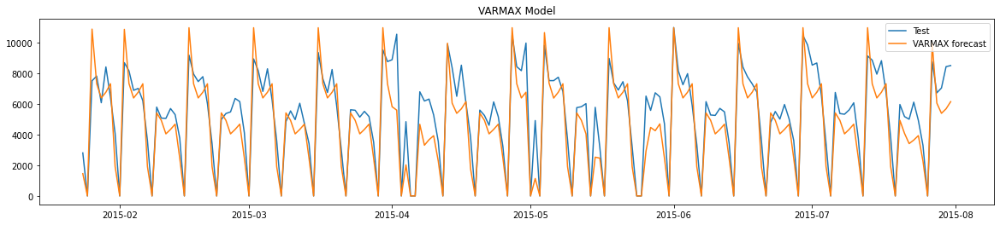

In [110]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_8['Sales'], label='Test')
plt.plot(y_hat_varmax_8['Sales'][test_8.index.min():], label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX Model')
plt.show()

In [111]:
evaluate_model('8', 'VARMAX (1, 1)', test_8, y_hat_varmax_8['Sales'])

,Store ID,Model Type,RMSE,MAE
8,8,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",2365.81,1745.19
9,8,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",978.89,695.95
10,8,"VAR (1, 0)",5041.65,4499.37
11,8,"VARMAX (1, 1)",1391.05,1064.84


**Observations:**
- SARIMAX model is better for store 8 series when compared to other 3 models.

# `Store 9` Time Series Analysis

In [112]:
# Remove columns having only 1 unique value. These columns don't have variance and won't contribute while modelling.
cols_to_remove = [col for col in store_9.columns if store_9[col].nunique() <= 1]
store_9.drop(cols_to_remove, inplace=True, axis=1)
store_9.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeekMon,DayOfWeekSat,DayOfWeekSun,DayOfWeekThu,DayOfWeekTue,DayOfWeekWed,StateHolidayEaster,StateHolidayNone,StateHolidayPublic
Date,,,,,,,,,,,,,,
2013-01-01,0,0,0,0,1,0,0,0,0,1,0,0,0,1
2013-01-02,4903,481,1,0,1,0,0,0,0,0,1,0,1,0
2013-01-03,4602,453,1,0,1,0,0,0,1,0,0,0,1,0
2013-01-04,4798,497,1,0,1,0,0,0,0,0,0,0,1,0
2013-01-05,4254,450,1,0,0,0,1,0,0,0,0,0,1,0


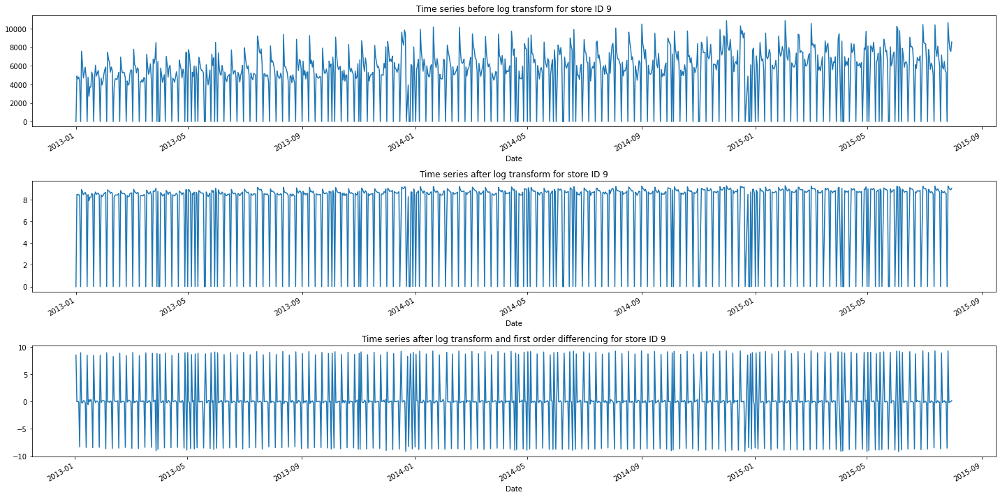

In [113]:
# Visualise the time series data for Store 9.
store_id = 9
store_9_log = data_log[data_log.Store == store_id]
store_9_log_diff = store_9_log.diff().dropna()

plt.figure(figsize=(20,10), tight_layout=True)
plt.subplot(311)
store_9['Sales'].plot()
plt.title(f'Time series before log transform for store ID {store_id}')

plt.subplot(312)
store_9_log['Sales'].plot()
plt.title(f'Time series after log transform for store ID {store_id}')

plt.subplot(313)
store_9_log_diff['Sales'].plot()
plt.title(f'Time series after log transform and first order differencing for store ID {store_id}')
plt.show()

**Observations:**
- The variance and mean is constant after performing log transform even without first order differencing.
- Let's test the stationarity of the series after performing log transform. If the series is not yet stationary, then let's do first order differencing.

In [114]:
get_stationarity_res(store_9[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,0.006084,stationary,0.01,not stationary
1,Customers,0.002703,stationary,0.01,not stationary


In [115]:
get_stationarity_res(store_9_log[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,1.751744e-08,stationary,0.1,stationary
1,Customers,1.542597e-08,stationary,0.1,stationary


**Observations:**
- After applying log transform, the time series is stationary. The differencing is not required for this series.

#### Stratified train and test split datasets
- Split 80% train and 20% test data respectively.
- Differencing is not considered for store 9's time series data.

In [116]:
train_len = int(len(store_9) * 0.8)
train_9 = store_9[:train_len]
test_9 = store_9[train_len:]

train_9_log = store_9_log[:train_len]
test_9_log = store_9_log[train_len:]

#### Plot ACF and PACF to determine non-seasonal p and q values

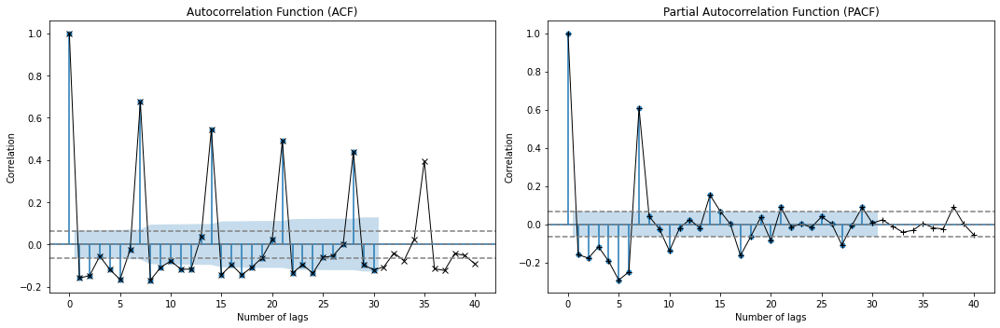

In [117]:
y=store_9_log['Sales']
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

#### Plot ACF and PACF to determine seasonal p and q values

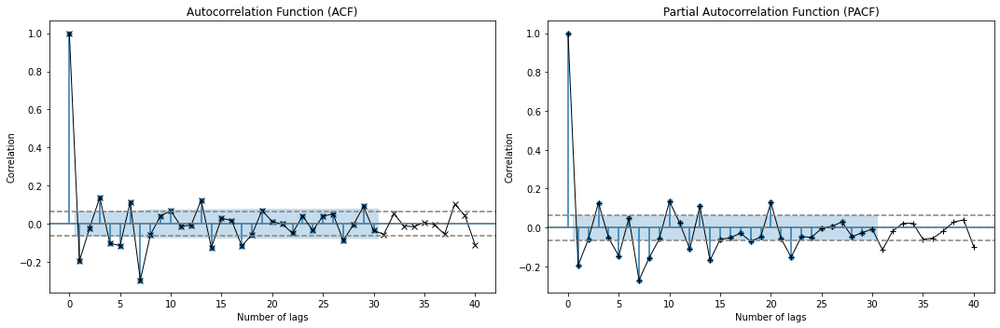

In [118]:
y=store_9_log['Sales'].diff(7).dropna() #store data is showing weekly trend
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

### Model 1: SARIMA Model for Store 9

In [119]:
sarima_model_9 = SARIMAX(train_9_log['Sales'], order=(1,1,1), seasonal_order=(1,1,1,7))
sarima_model_9_fit = sarima_model_9.fit()
print(sarima_model_9_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  737
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood               -1602.990
Date:                           Tue, 22 Feb 2022   AIC                           3215.980
Time:                                   14:12:07   BIC                           3238.938
Sample:                                        0   HQIC                          3224.838
                                           - 737                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1731      0.022     -7.876      0.000      -0.216      -0.130
ma.L1         -0.9999      0.367     -2.727

#### Recover original time series

In [120]:
y_hat_sarima_9 = store_9_log.copy()
y_hat_sarima_9['sarima_forecast_log'] = sarima_model_9_fit.predict(store_9_log.index.min(), len(store_9_log)-1).values
y_hat_sarima_9['sarima_forecast'] = np.exp(y_hat_sarima_9['sarima_forecast_log'])

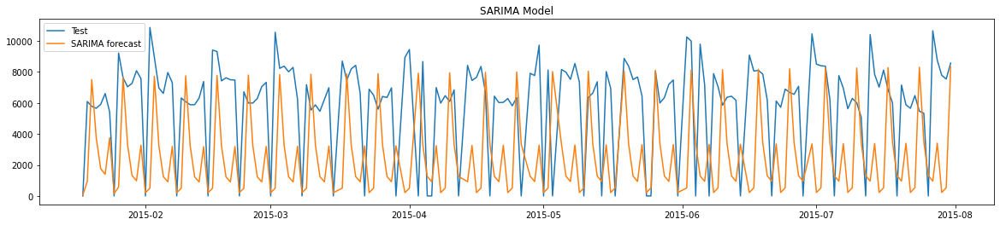

In [121]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_9['Sales'], label='Test')
plt.plot(y_hat_sarima_9['sarima_forecast'][test_9.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Forecasting for the next 6 weeks

In [122]:
# Create a series to forecast for the next 6 weeks.
six_weeks_range = pd.date_range(store_9_log.index.max(), periods=42)
num_of_days = len(train_9_log) + (pd.to_datetime(six_weeks_range[-1]) - train_9_log.index.max()).days - 1
date_range = pd.date_range(train_9_log.index.max(), six_weeks_range[-1])
six_week_forecast = pd.Series(sarima_model_9_fit.predict(train_9_log.index.max(), num_of_days).values, index=date_range)
six_week_forecast = np.exp(six_week_forecast)

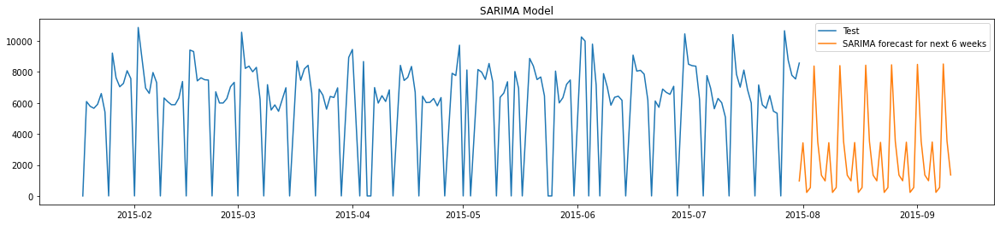

In [123]:
plt.figure(figsize=(20,4))
plt.plot(test_9['Sales'], label='Test')
plt.plot(six_week_forecast[test_9.index.max():], label='SARIMA forecast for next 6 weeks')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Model Evaluation

In [124]:
evaluate_model('9', 'SARIMA (1, 1, 1)x(1, 1, 1, 7)', test_9, y_hat_sarima_9['sarima_forecast'])

,Store ID,Model Type,RMSE,MAE
12,9,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",5048.92,4298.76


### Model 2: SARIMAX Model for Store 9
- To forecast for the next 6 weeks from the last date in dataset, exogenous variable data for the next 6 weeks should be available. Since this is not available, we will try to forecast the Sales within the available data.

In [125]:
# Using all variables as exogenious variables except for sales and customers
exog = train_9.drop(['Sales', 'Customers'], axis=1).columns
sarimax_model_9 = SARIMAX(train_9_log['Sales'], exog=train_9_log[exog], order=(1,1,1), seasonal_order=(1,1,1,7))
sarimax_model_9_fit = sarimax_model_9.fit()
print(sarimax_model_9_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  737
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood                 552.466
Date:                           Tue, 22 Feb 2022   AIC                          -1070.932
Time:                                   14:12:17   BIC                           -992.873
Sample:                                        0   HQIC                         -1040.814
                                           - 737                                         
Covariance Type:                             opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Open                   5.7145      0.024    239.000      0.000       5.668       5.761
Promo              

#### Recover original time series

In [126]:
y_hat_sarimax_9 = store_9_log.copy()
y_hat_sarimax_9['sarimax_forecast_log'] = sarimax_model_9_fit.predict(store_9_log.index.min(), len(store_9_log)-1, exog=test_9_log[exog]).values
y_hat_sarimax_9['sarimax_forecast'] = np.exp(y_hat_sarimax_9['sarimax_forecast_log'])

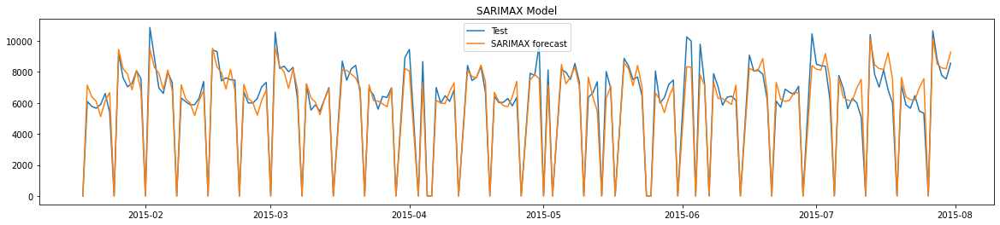

In [127]:
plt.figure(figsize=(20,4))
plt.plot(test_9['Sales'], label='Test')
plt.plot(y_hat_sarimax_9['sarimax_forecast'][test_9.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX Model')
plt.show()

#### Model Evaluation

In [128]:
evaluate_model('9', 'SARIMAX (1, 1, 1)x(1, 1, 1, 7)', test_9, y_hat_sarimax_9['sarimax_forecast'])

,Store ID,Model Type,RMSE,MAE
12,9,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",5048.92,4298.76
13,9,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",742.33,519.14


### Model 3: VAR Model for Store 9

In [129]:
# Check for cointegration. If time is cointegrated/stationary, then we can proceed with building VAR/VARMAX models.
cointegration_test(store_9_log)

Time series are stationary/cointegrated.


In [130]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VAR model
var_model_9 = sm.tsa.VARMAX(train_9_log[['Sales', 'Customers']].astype('float'), order=(1, 0))
var_model_9_fit = var_model_9.fit(maxiter=1000, disp=False)
var_model_9_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,737
Model:,VAR(1),Log Likelihood,-561.580
,+ intercept,AIC,1141.160
Date:,"Tue, 22 Feb 2022",BIC,1182.583
Time:,14:12:23,HQIC,1157.134
Sample:,0,,
,- 737,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.30, 0.54",Jarque-Bera (JB):,"338.56, 11.66"
Prob(Q):,"0.58, 0.46",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"1.11, 1.00",Skew:,"-1.61, -0.04"


#### Recover original time series

In [131]:
y_hat_var_9 = store_9_log.copy()
predictions = var_model_9_fit.predict(store_9_log.index.min(), len(store_9_log) - 1)
predictions['Date'] = store_9_log.index
predictions.set_index('Date', inplace=True)
y_hat_var_9[['Sales', 'Customers']] = predictions
y_hat_var_9[['Sales', 'Customers']] = np.exp(y_hat_var_9[['Sales', 'Customers']])

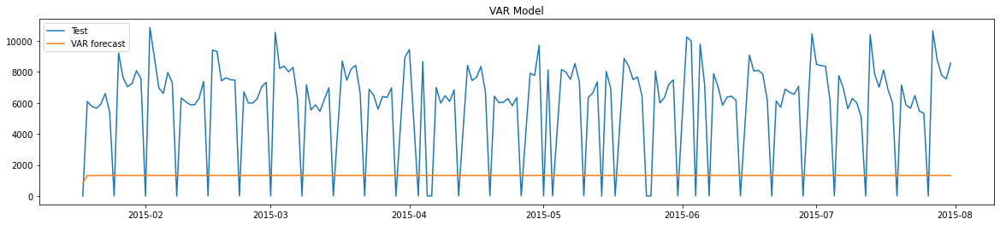

In [132]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_9['Sales'], label='Test')
plt.plot(y_hat_var_9['Sales'][test_9.index.min():], label='VAR forecast')
plt.legend(loc='upper left')
plt.title('VAR Model')
plt.show()

In [133]:
evaluate_model('9', 'VAR (1, 0)', test_9, y_hat_var_9['Sales'])

,Store ID,Model Type,RMSE,MAE
12,9,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",5048.92,4298.76
13,9,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",742.33,519.14
14,9,"VAR (1, 0)",5526.82,5100.92


### Model 4: VARMAX Model for Store 9

In [134]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VARMAX model
exog = train_9.drop(['Sales', 'Customers'], axis=1).columns
varmax_model_9 = sm.tsa.VARMAX(train_9_log[['Sales', 'Customers']].astype('float'), order=(1, 1), exog=train_9_log[exog])
varmax_model_9_fit = varmax_model_9.fit(maxiter=1000, disp=False)
varmax_model_9_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,737
Model:,"VARMAX(1,1)",Log Likelihood,125.461
,+ intercept,AIC,-176.922
Date:,"Tue, 22 Feb 2022",BIC,-6.626
Time:,14:16:07,HQIC,-111.249
Sample:,0,,
,- 737,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"39.72, 1.90",Jarque-Bera (JB):,"165.61, 35.35"
Prob(Q):,"0.00, 0.17",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"0.88, 0.90",Skew:,"-0.77, -0.27"


#### Recover original time series

In [135]:
y_hat_varmax_9 = store_9_log.copy()
predictions = varmax_model_9_fit.predict(store_9_log.index.min(), len(store_9_log) - 1, exog=test_9_log[exog])
predictions['Date'] = store_9_log.index
predictions.set_index('Date', inplace=True)
y_hat_varmax_9[['Sales', 'Customers']] = predictions
y_hat_varmax_9[['Sales', 'Customers']] = np.exp(y_hat_varmax_9[['Sales', 'Customers']])

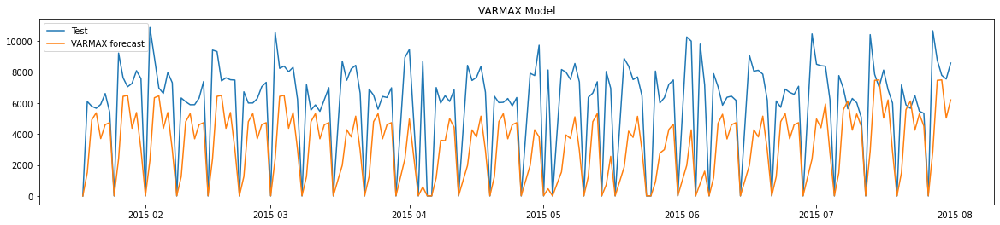

In [136]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_9['Sales'], label='Test')
plt.plot(y_hat_varmax_9['Sales'][test_9.index.min():], label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX Model')
plt.show()

In [137]:
evaluate_model('9', 'VARMAX (1, 1)', test_9, y_hat_varmax_9['Sales'])

,Store ID,Model Type,RMSE,MAE
12,9,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",5048.92,4298.76
13,9,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",742.33,519.14
14,9,"VAR (1, 0)",5526.82,5100.92
15,9,"VARMAX (1, 1)",3555.95,2675.37


**Observations:**
- SARIMAX model is better for store 9 series when compared to other 3 models.

# `Store 13` Time Series Analysis

In [138]:
# Remove columns having only 1 unique value. These columns don't have variance and won't contribute while modelling.
cols_to_remove = [col for col in store_13.columns if store_13[col].nunique() <= 1]
store_13.drop(cols_to_remove, inplace=True, axis=1)
store_13.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeekMon,DayOfWeekSat,DayOfWeekSun,DayOfWeekThu,DayOfWeekTue,DayOfWeekWed,StateHolidayEaster,StateHolidayNone,StateHolidayPublic
Date,,,,,,,,,,,,,,
2013-01-01,0,0,0,0,1,0,0,0,0,1,0,0,0,1
2013-01-02,3737,317,1,0,1,0,0,0,0,0,1,0,1,0
2013-01-03,3674,292,1,0,1,0,0,0,1,0,0,0,1,0
2013-01-04,3848,340,1,0,1,0,0,0,0,0,0,0,1,0
2013-01-05,4285,344,1,0,0,0,1,0,0,0,0,0,1,0


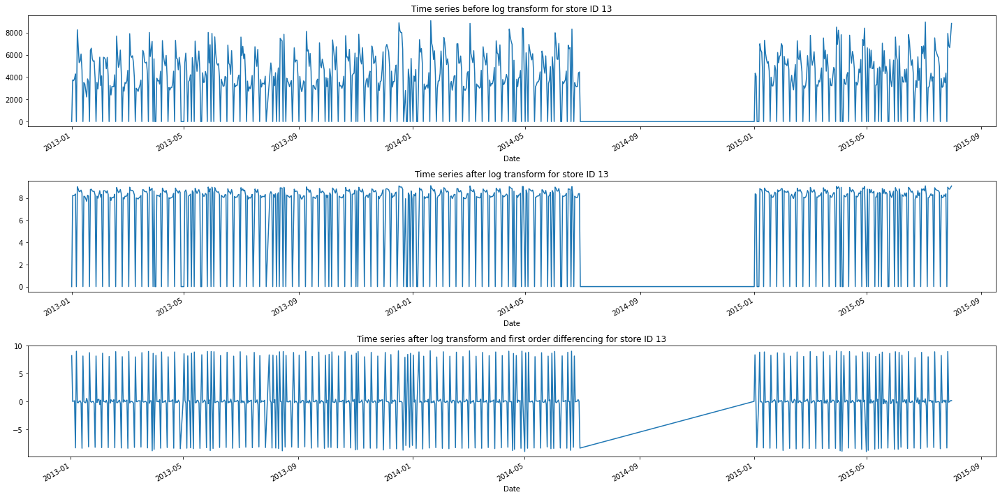

In [139]:
# Visualise the time series data for Store 13.
store_id = 13
store_13_log = data_log[data_log.Store == store_id]
store_13_log_diff = store_13_log.diff().dropna()

plt.figure(figsize=(20,10), tight_layout=True)
plt.subplot(311)
store_13['Sales'].plot()
plt.title(f'Time series before log transform for store ID {store_id}')

plt.subplot(312)
store_13_log['Sales'].plot()
plt.title(f'Time series after log transform for store ID {store_id}')

plt.subplot(313)
store_13_log_diff['Sales'].plot()
plt.title(f'Time series after log transform and first order differencing for store ID {store_id}')
plt.show()

**Observations:**
- The variance and mean is constant after performing log transform even without first order differencing.
- Let's test the stationarity of the series before performing log transform. If the series is not yet stationary, then let's do log transformtion followed by first order differencing.

In [140]:
get_stationarity_res(store_13[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,0.000004,stationary,0.063291,stationary
1,Customers,0.000018,stationary,0.100000,stationary


**Observations:**
- For this time series, the differencing and log transformation is not even required since the time series is already stationary.

#### Stratified train and test split datasets
- Split 80% train and 20% test data respectively.
- Differencing and transformation are not considered for store 13's time series data.

In [141]:
train_len = int(len(store_13) * 0.8)
train_13 = store_13[:train_len]
test_13 = store_13[train_len:]

train_13_log = store_13_log[:train_len]
test_13_log = store_13_log[train_len:]

#### Plot ACF and PACF to determine non-seasonal p and q values

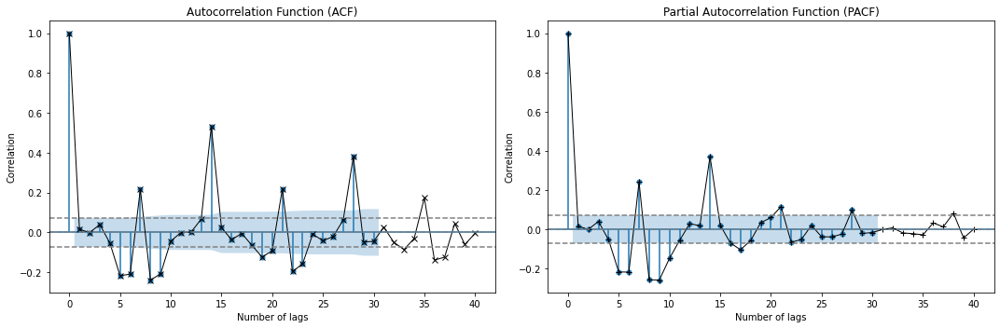

In [142]:
y=store_13['Sales']
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

#### Plot ACF and PACF to determine seasonal p and q values

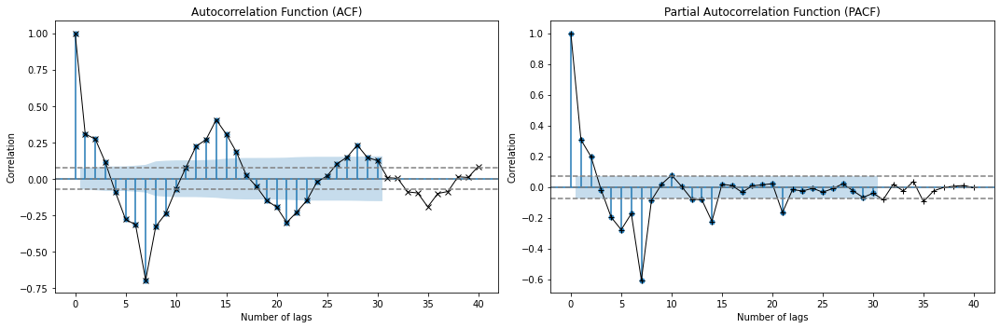

In [143]:
y=store_13['Sales'].diff(7).dropna() #store data is showing weekly trend
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

### Model 1: SARIMA Model for Store 13

In [144]:
sarima_model_13 = SARIMAX(train_13['Sales'], order=(1,0,1), seasonal_order=(2,1,2,7))
sarima_model_13_fit = sarima_model_13.fit()
print(sarima_model_13_fit.summary())

                                       SARIMAX Results                                        
Dep. Variable:                                  Sales   No. Observations:                  593
Model:             SARIMAX(1, 0, 1)x(2, 1, [1, 2], 7)   Log Likelihood               -5285.497
Date:                                Tue, 22 Feb 2022   AIC                          10584.993
Time:                                        14:16:15   BIC                          10615.606
Sample:                                             0   HQIC                         10596.923
                                                - 593                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9950      0.071    -14.017      0.000      -1.134      -0.856
ma.

#### Recover original time series

In [145]:
y_hat_sarima_13 = store_13.copy()
y_hat_sarima_13['sarima_forecast'] = sarima_model_13_fit.predict(store_13.index.min(), len(store_13)-1).values

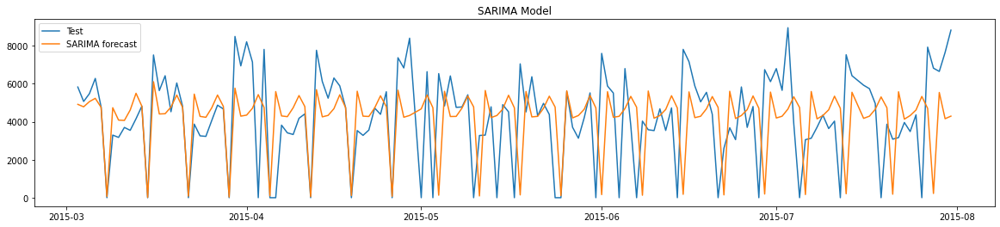

In [146]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_13['Sales'], label='Test')
plt.plot(y_hat_sarima_13['sarima_forecast'][test_13.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Forecasting for the next 6 weeks

In [147]:
# Create a series to forecast for the next 6 weeks.
six_weeks_range = pd.date_range(store_13.index.max(), periods=42)
num_of_days = len(train_13) + (pd.to_datetime(six_weeks_range[-1]) - train_13.index.max()).days - 1
date_range = pd.date_range(train_13.index.max(), six_weeks_range[-1])
six_week_forecast = pd.Series(sarima_model_13_fit.predict(train_13.index.max(), num_of_days).values, index=date_range)

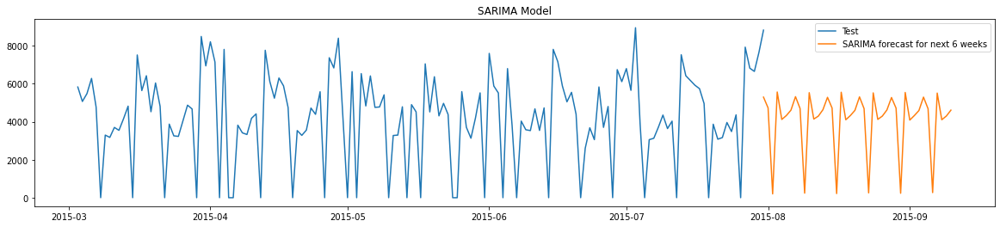

In [148]:
plt.figure(figsize=(20,4))
plt.plot(test_13['Sales'], label='Test')
plt.plot(six_week_forecast[test_13.index.max():], label='SARIMA forecast for next 6 weeks')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Model Evaluation

In [149]:
evaluate_model('13', 'SARIMA (1, 0, 1)x(2, 1, 2, 7)', test_13, y_hat_sarima_13['sarima_forecast'])

,Store ID,Model Type,RMSE,MAE
16,13,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2689.55,1907.55


### Model 2: SARIMAX Model for Store 13
- To forecast for the next 6 weeks from the last date in dataset, exogenous variable data for the next 6 weeks should be available. Since this is not available, we will try to forecast the Sales within the available data.

In [150]:
# Using all variables as exogenious variables except for sales and customers
exog = train_13.drop(['Sales', 'Customers'], axis=1).columns
sarimax_model_13 = SARIMAX(train_13['Sales'], exog=train_13[exog], order=(1,0,1), seasonal_order=(2,1,2,7))
sarimax_model_13_fit = sarimax_model_13.fit()
print(sarimax_model_13_fit.summary())

                                       SARIMAX Results                                        
Dep. Variable:                                  Sales   No. Observations:                  593
Model:             SARIMAX(1, 0, 1)x(2, 1, [1, 2], 7)   Log Likelihood               -4686.283
Date:                                Tue, 22 Feb 2022   AIC                           9410.565
Time:                                        14:16:32   BIC                           9493.658
Sample:                                             0   HQIC                          9442.946
                                                - 593                                         
Covariance Type:                                  opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Open                2891.1995    503.600      5.741      0.000    

#### Recover original time series

In [151]:
y_hat_sarimax_13 = store_13.copy()
y_hat_sarimax_13['sarimax_forecast'] = sarimax_model_13_fit.predict(store_13.index.min(), len(store_13)-1, exog=test_13[exog]).values

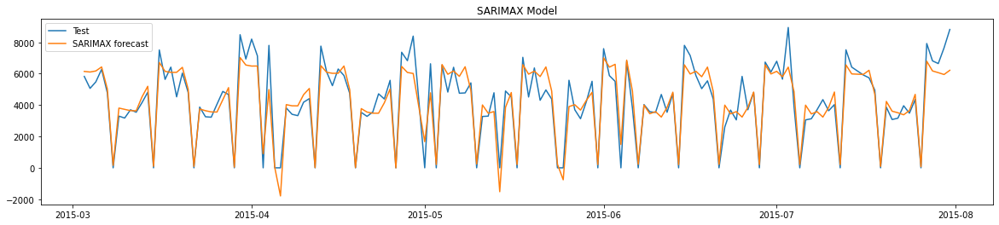

In [152]:
plt.figure(figsize=(20,4))
plt.plot(test_13['Sales'], label='Test')
plt.plot(y_hat_sarimax_13['sarimax_forecast'][test_13.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX Model')
plt.show()

#### Model Evaluation

In [153]:
evaluate_model('13', 'SARIMAX (1, 0, 1)x(2, 1, 2, 7)', test_13, y_hat_sarimax_13['sarimax_forecast'])

,Store ID,Model Type,RMSE,MAE
16,13,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2689.55,1907.55
17,13,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",870.80,632.74


### Model 13: VAR Model for Store 13

In [154]:
# Check for cointegration. If time is cointegrated/stationary, then we can proceed with building VAR/VARMAX models.
cointegration_test(store_13)

Time series are stationary/cointegrated.


In [155]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VAR model
var_model_13 = sm.tsa.VARMAX(train_13[['Sales', 'Customers']].astype('float'), order=(1, 0))
var_model_13_fit = var_model_13.fit(maxiter=1000, disp=False)
var_model_13_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,593
Model:,VAR(1),Log Likelihood,-8205.868
,+ intercept,AIC,16429.736
Date:,"Tue, 22 Feb 2022",BIC,16469.203
Time:,14:16:34,HQIC,16445.108
Sample:,0,,
,- 593,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"3.62, 0.99",Jarque-Bera (JB):,"42.86, 3.69"
Prob(Q):,"0.06, 0.32",Prob(JB):,"0.00, 0.16"
Heteroskedasticity (H):,"1.23, 1.02",Skew:,"-0.65, -0.19"


#### Recover original time series

In [156]:
y_hat_var_13 = store_13.copy()
predictions = var_model_13_fit.predict(store_13.index.min(), len(store_13) - 1)
predictions['Date'] = store_13.index
predictions.set_index('Date', inplace=True)
y_hat_var_13[['Sales', 'Customers']] = predictions

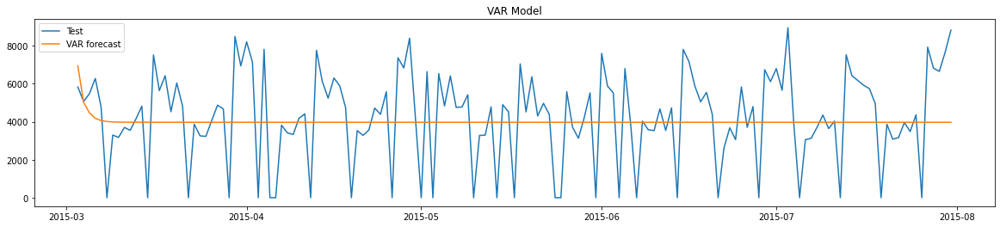

In [157]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_13['Sales'], label='Test')
plt.plot(y_hat_var_13['Sales'][test_13.index.min():], label='VAR forecast')
plt.legend(loc='upper left')
plt.title('VAR Model')
plt.show()

In [158]:
evaluate_model('13', 'VAR (1, 0)', test_13, y_hat_var_13['Sales'])

,Store ID,Model Type,RMSE,MAE
16,13,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2689.55,1907.55
17,13,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",870.80,632.74
18,13,"VAR (1, 0)",2422.39,1908.24


### Model 4: VARMAX Model for Store 13

In [159]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VARMAX model
exog = train_13.drop(['Sales', 'Customers'], axis=1).columns
varmax_model_13 = sm.tsa.VARMAX(train_13[['Sales', 'Customers']].astype('float'), order=(1, 1), exog=train_13[exog])
varmax_model_13_fit = varmax_model_13.fit(maxiter=1000, disp=False)
varmax_model_13_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,593
Model:,"VARMAX(1,1)",Log Likelihood,-7491.353
,+ intercept,AIC,15056.707
Date:,"Tue, 22 Feb 2022",BIC,15218.959
Time:,14:22:08,HQIC,15119.902
Sample:,0,,
,- 593,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"2.15, 1.79",Jarque-Bera (JB):,"198.83, 231.98"
Prob(Q):,"0.14, 0.18",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"1.13, 1.05",Skew:,"0.99, -0.37"


#### Recover original time series

In [160]:
y_hat_varmax_13 = store_13.copy()
predictions = varmax_model_13_fit.predict(store_13.index.min(), len(store_13) - 1, exog=test_13[exog])
predictions['Date'] = store_13.index
predictions.set_index('Date', inplace=True)
y_hat_varmax_13[['Sales', 'Customers']] = predictions

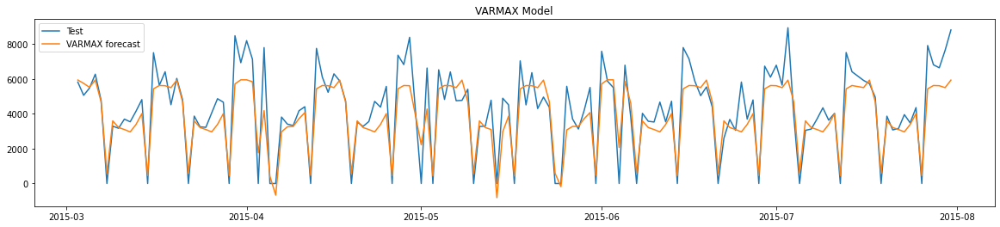

In [161]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_13['Sales'], label='Test')
plt.plot(y_hat_varmax_13['Sales'][test_13.index.min():], label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX Model')
plt.show()

In [162]:
evaluate_model('13', 'VARMAX (1, 1)', test_13, y_hat_varmax_13['Sales'])

,Store ID,Model Type,RMSE,MAE
16,13,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2689.55,1907.55
17,13,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",870.80,632.74
18,13,"VAR (1, 0)",2422.39,1908.24
19,13,"VARMAX (1, 1)",1134.00,841.01


**Observations:**
- SARIMAX model is better for store 13 series when compared to other 3 models.

# `Store 25` Time Series Analysis

In [163]:
# Remove columns having only 1 unique value. These columns don't have variance and won't contribute while modelling.
cols_to_remove = [col for col in store_25.columns if store_25[col].nunique() <= 1]
store_25.drop(cols_to_remove, inplace=True, axis=1)
store_25.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeekMon,DayOfWeekSat,DayOfWeekSun,DayOfWeekThu,DayOfWeekTue,DayOfWeekWed,StateHolidayEaster,StateHolidayNone,StateHolidayPublic
Date,,,,,,,,,,,,,,
2013-01-01,0,0,0,0,1,0,0,0,0,1,0,0,0,1
2013-01-02,11944,1698,1,0,1,0,0,0,0,0,1,0,1,0
2013-01-03,10409,1587,1,0,1,0,0,0,1,0,0,0,1,0
2013-01-04,9729,1520,1,0,1,0,0,0,0,0,0,0,1,0
2013-01-05,8987,1381,1,0,0,0,1,0,0,0,0,0,1,0


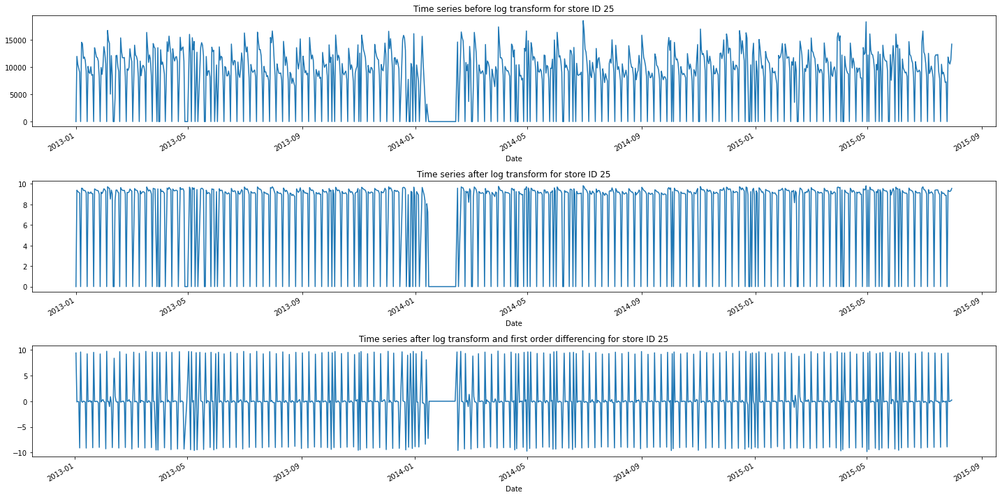

In [164]:
# Visualise the time series data for Store 25.
store_id = 25
store_25_log = data_log[data_log.Store == store_id]
store_25_log_diff = store_25_log.diff().dropna()

plt.figure(figsize=(20,10), tight_layout=True)
plt.subplot(311)
store_25['Sales'].plot()
plt.title(f'Time series before log transform for store ID {store_id}')

plt.subplot(312)
store_25_log['Sales'].plot()
plt.title(f'Time series after log transform for store ID {store_id}')

plt.subplot(313)
store_25_log_diff['Sales'].plot()
plt.title(f'Time series after log transform and first order differencing for store ID {store_id}')
plt.show()

**Observations:**
- The variance and mean is constant after performing log transform even without first order differencing.
- Let's test the stationarity of the series before performing log transform. If the series is not yet stationary, then let's do log transformtion followed by first order differencing.

In [165]:
get_stationarity_res(store_25[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,0.001343,stationary,0.1,stationary
1,Customers,0.003121,stationary,0.1,stationary


**Observations:**
- For this time series, the differencing and log transformation is not even required since the time series is already stationary.

#### Stratified train and test split datasets
- Split 80% train and 20% test data respectively.
- Differencing and transformation are not considered for store 25's time series data.

In [166]:
train_len = int(len(store_25) * 0.8)
train_25 = store_25[:train_len]
test_25 = store_25[train_len:]

train_25_log = store_25_log[:train_len]
test_25_log = store_25_log[train_len:]

#### Plot ACF and PACF to determine non-seasonal p and q values

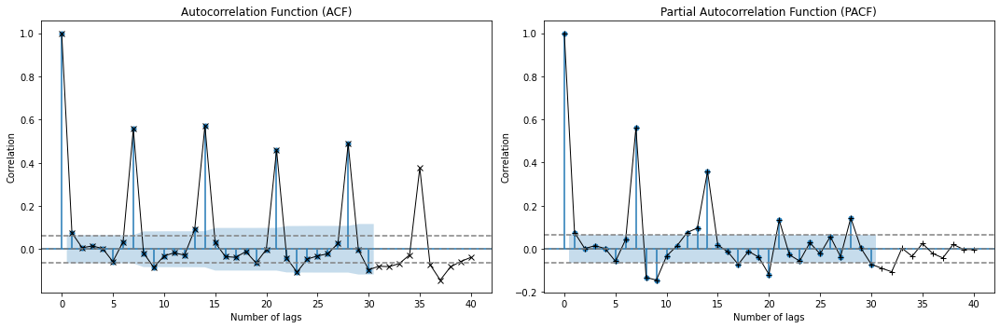

In [167]:
y=store_25['Sales']
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

#### Plot ACF and PACF to determine seasonal p and q values

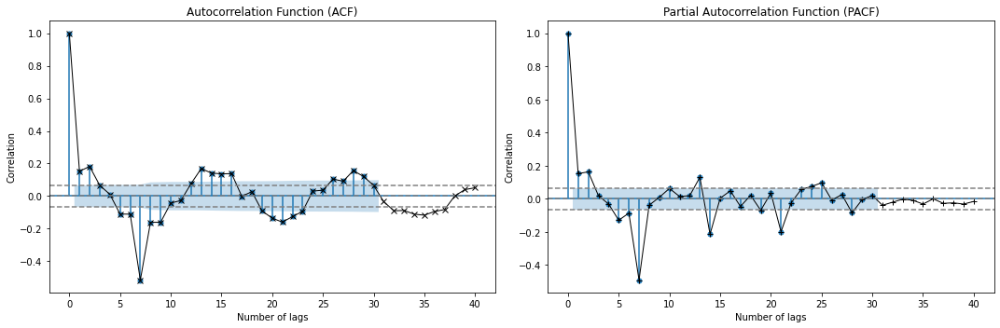

In [168]:
y=store_25['Sales'].diff(7).dropna() #store data is showing weekly trend
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

### Model 1: SARIMA Model for Store 25

In [169]:
sarima_model_25 = SARIMAX(train_25['Sales'], order=(2,0,2), seasonal_order=(2,1,2,7))
sarima_model_25_fit = sarima_model_25.fit()
print(sarima_model_25_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  736
Model:             SARIMAX(2, 0, 2)x(2, 1, 2, 7)   Log Likelihood               -7056.422
Date:                           Tue, 22 Feb 2022   AIC                          14130.843
Time:                                   14:22:21   BIC                          14172.168
Sample:                                        0   HQIC                         14146.788
                                           - 736                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.7033      0.041     41.891      0.000       1.624       1.783
ar.L2         -0.9217      0.037    -25.014

#### Recover original time series

In [170]:
y_hat_sarima_25 = store_25.copy()
y_hat_sarima_25['sarima_forecast'] = sarima_model_25_fit.predict(store_25.index.min(), len(store_25)-1).values

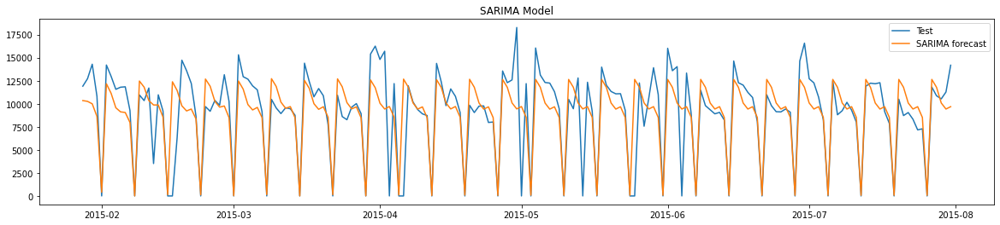

In [171]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_25['Sales'], label='Test')
plt.plot(y_hat_sarima_25['sarima_forecast'][test_25.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Forecasting for the next 6 weeks

In [172]:
# Create a series to forecast for the next 6 weeks.
six_weeks_range = pd.date_range(store_25.index.max(), periods=42)
num_of_days = len(train_25) + (pd.to_datetime(six_weeks_range[-1]) - train_25.index.max()).days - 1
date_range = pd.date_range(train_25.index.max(), six_weeks_range[-1])
six_week_forecast = pd.Series(sarima_model_25_fit.predict(train_25.index.max(), num_of_days).values, index=date_range)

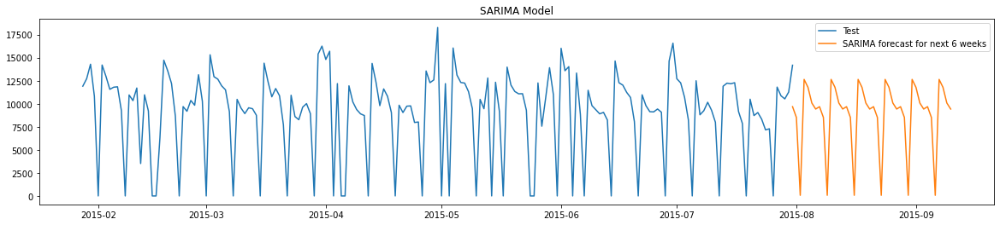

In [173]:
plt.figure(figsize=(20,4))
plt.plot(test_25['Sales'], label='Test')
plt.plot(six_week_forecast[test_25.index.max():], label='SARIMA forecast for next 6 weeks')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Model Evaluation

In [174]:
evaluate_model('25', 'SARIMA (2, 0, 2)x(2, 1, 2, 7)', test_25, y_hat_sarima_25['sarima_forecast'])

,Store ID,Model Type,RMSE,MAE
20,25,"SARIMA (2, 0, 2)x(2, 1, 2, 7)",2978.15,1887.97


### Model 2: SARIMAX Model for Store 25
- To forecast for the next 6 weeks from the last date in dataset, exogenous variable data for the next 6 weeks should be available. Since this is not available, we will try to forecast the Sales within the available data.

In [175]:
# Using all variables as exogenious variables except for sales and customers
exog = train_25.drop(['Sales', 'Customers'], axis=1).columns
sarimax_model_25 = SARIMAX(train_25['Sales'], exog=train_25[exog], order=(2,0,2), seasonal_order=(2,1,2,7))
sarimax_model_25_fit = sarimax_model_25.fit()
print(sarimax_model_25_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  736
Model:             SARIMAX(2, 0, 2)x(2, 1, 2, 7)   Log Likelihood               -6469.035
Date:                           Tue, 22 Feb 2022   AIC                          12980.069
Time:                                   14:22:38   BIC                          13076.495
Sample:                                        0   HQIC                         13017.273
                                           - 736                                         
Covariance Type:                             opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Open                9465.3692    389.677     24.290      0.000    8701.617    1.02e+04
Promo              

#### Recover original time series

In [176]:
y_hat_sarimax_25 = store_25.copy()
y_hat_sarimax_25['sarimax_forecast'] = sarimax_model_25_fit.predict(store_25.index.min(), len(store_25)-1, exog=test_25[exog]).values

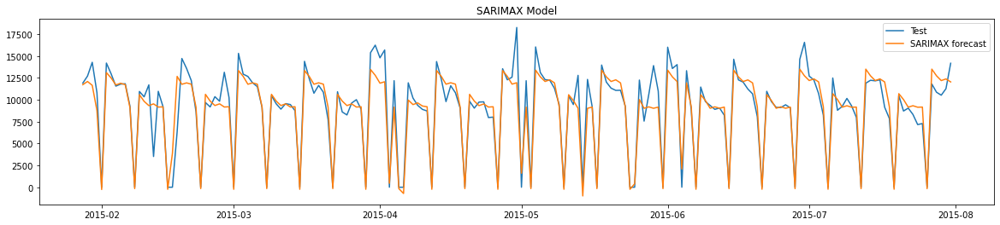

In [177]:
plt.figure(figsize=(20,4))
plt.plot(test_25['Sales'], label='Test')
plt.plot(y_hat_sarimax_25['sarimax_forecast'][test_25.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX Model')
plt.show()

#### Model Evaluation

In [178]:
evaluate_model('25', 'SARIMAX (2, 0, 2)x(2, 1, 2, 7)', test_25, y_hat_sarimax_25['sarimax_forecast'])

,Store ID,Model Type,RMSE,MAE
20,25,"SARIMA (2, 0, 2)x(2, 1, 2, 7)",2978.15,1887.97
21,25,"SARIMAX (2, 0, 2)x(2, 1, 2, 7)",1540.81,1001.18


### Model 25: VAR Model for Store 25

In [179]:
# Check for cointegration. If time is cointegrated/stationary, then we can proceed with building VAR/VARMAX models.
cointegration_test(store_25)

Time series are stationary/cointegrated.


In [180]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VAR model
var_model_25 = sm.tsa.VARMAX(train_25[['Sales', 'Customers']].astype('float'), order=(2, 0))
var_model_25_fit = var_model_25.fit(maxiter=1000, disp=False)
var_model_25_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,736
Model:,VAR(2),Log Likelihood,-11599.589
,+ intercept,AIC,23225.178
Date:,"Tue, 22 Feb 2022",BIC,23284.994
Time:,14:22:43,HQIC,23248.246
Sample:,0,,
,- 736,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.00, 0.15",Jarque-Bera (JB):,"79.07, 490.14"
Prob(Q):,"1.00, 0.70",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"0.91, 1.13",Skew:,"-0.76, -0.68"


#### Recover original time series

In [181]:
y_hat_var_25 = store_25.copy()
predictions = var_model_25_fit.predict(store_25.index.min(), len(store_25) - 1)
predictions['Date'] = store_25.index
predictions.set_index('Date', inplace=True)
y_hat_var_25[['Sales', 'Customers']] = predictions

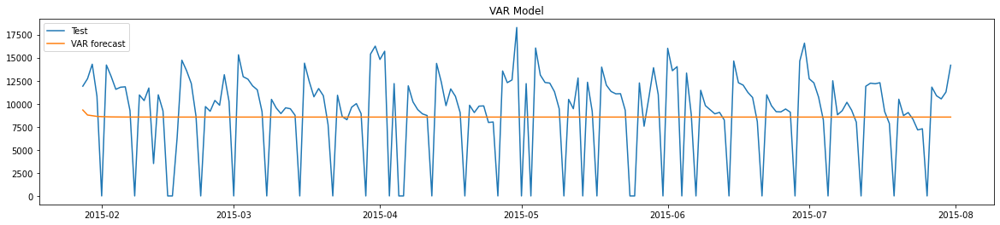

In [182]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_25['Sales'], label='Test')
plt.plot(y_hat_var_25['Sales'][test_25.index.min():], label='VAR forecast')
plt.legend(loc='upper left')
plt.title('VAR Model')
plt.show()

In [183]:
evaluate_model('25', 'VAR (2, 0)', test_25, y_hat_var_25['Sales'])

,Store ID,Model Type,RMSE,MAE
20,25,"SARIMA (2, 0, 2)x(2, 1, 2, 7)",2978.15,1887.97
21,25,"SARIMAX (2, 0, 2)x(2, 1, 2, 7)",1540.81,1001.18
22,25,"VAR (2, 0)",4726.77,3717.55


### Model 4: VARMAX Model for Store 25

In [184]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VARMAX model
exog = train_25.drop(['Sales', 'Customers'], axis=1).columns
varmax_model_25 = sm.tsa.VARMAX(train_25[['Sales', 'Customers']].astype('float'), order=(2, 2), exog=train_25[exog])
varmax_model_25_fit = varmax_model_25.fit(maxiter=1000, disp=False)
varmax_model_25_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,736
Model:,"VARMAX(2,2)",Log Likelihood,-11160.309
,+ intercept,AIC,22410.618
Date:,"Tue, 22 Feb 2022",BIC,22617.674
Time:,14:34:54,HQIC,22490.471
Sample:,0,,
,- 736,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.85, 29.58",Jarque-Bera (JB):,"7.37, 174.72"
Prob(Q):,"0.36, 0.00",Prob(JB):,"0.03, 0.00"
Heteroskedasticity (H):,"0.75, 1.00",Skew:,"0.17, -0.37"


#### Recover original time series

In [185]:
y_hat_varmax_25 = store_25.copy()
predictions = varmax_model_25_fit.predict(store_25.index.min(), len(store_25) - 1, exog=test_25[exog])
predictions['Date'] = store_25.index
predictions.set_index('Date', inplace=True)
y_hat_varmax_25[['Sales', 'Customers']] = predictions

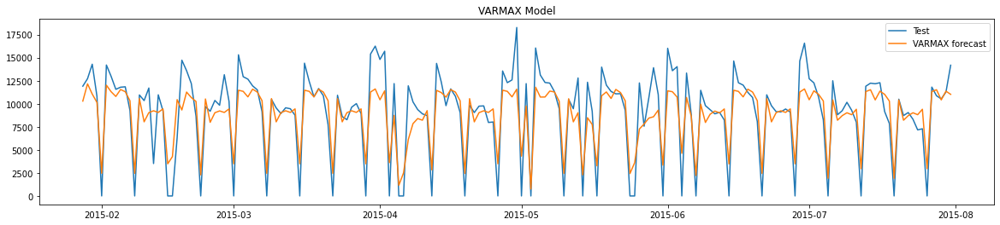

In [186]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_25['Sales'], label='Test')
plt.plot(y_hat_varmax_25['Sales'][test_25.index.min():], label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX Model')
plt.show()

In [187]:
evaluate_model('25', 'VARMAX (2, 2)', test_25, y_hat_varmax_25['Sales'])

,Store ID,Model Type,RMSE,MAE
20,25,"SARIMA (2, 0, 2)x(2, 1, 2, 7)",2978.15,1887.97
21,25,"SARIMAX (2, 0, 2)x(2, 1, 2, 7)",1540.81,1001.18
22,25,"VAR (2, 0)",4726.77,3717.55
23,25,"VARMAX (2, 2)",2315.68,1806.65


**Observations:**
- SARIMAX model is better for store 25 series when compared to other 3 models.

# `Store 29` Time Series Analysis

In [188]:
# Remove columns having only 1 unique value. These columns don't have variance and won't contribute while modelling.
cols_to_remove = [col for col in store_29.columns if store_29[col].nunique() <= 1]
store_29.drop(cols_to_remove, inplace=True, axis=1)
store_29.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeekMon,DayOfWeekSat,DayOfWeekSun,DayOfWeekThu,DayOfWeekTue,DayOfWeekWed,StateHolidayEaster,StateHolidayNone,StateHolidayPublic
Date,,,,,,,,,,,,,,
2013-01-01,0,0,0,0,1,0,0,0,0,1,0,0,0,1
2013-01-02,5269,550,1,0,1,0,0,0,0,0,1,0,1,0
2013-01-03,4554,456,1,0,1,0,0,0,1,0,0,0,1,0
2013-01-04,5411,505,1,0,1,0,0,0,0,0,0,0,1,0
2013-01-05,5564,537,1,0,0,0,1,0,0,0,0,0,1,0


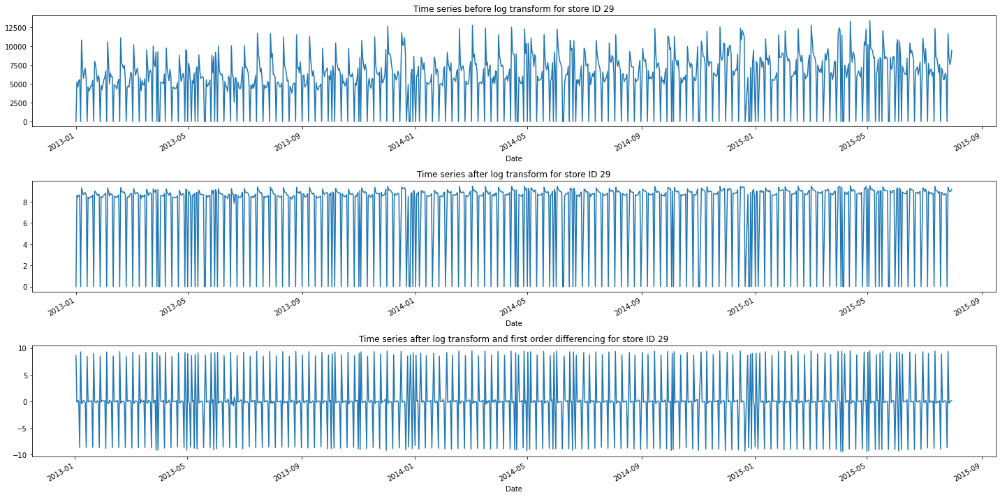

In [189]:
# Visualise the time series data for Store 29.
store_id = 29
store_29_log = data_log[data_log.Store == store_id]
store_29_log_diff = store_29_log.diff().dropna()

plt.figure(figsize=(20,10), tight_layout=True)
plt.subplot(311)
store_29['Sales'].plot()
plt.title(f'Time series before log transform for store ID {store_id}')

plt.subplot(312)
store_29_log['Sales'].plot()
plt.title(f'Time series after log transform for store ID {store_id}')

plt.subplot(313)
store_29_log_diff['Sales'].plot()
plt.title(f'Time series after log transform and first order differencing for store ID {store_id}')
plt.show()

**Observations:**
- The variance and mean is constant after performing log transform even without first order differencing.
- Let's test the stationarity of the series after performing log transform. If the series is not yet stationary, then let's do first order differencing.

In [190]:
get_stationarity_res(store_29[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,0.003832,stationary,0.01,not stationary
1,Customers,0.002644,stationary,0.01,not stationary


In [191]:
get_stationarity_res(store_29_log[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,1.272043e-08,stationary,0.1,stationary
1,Customers,1.168224e-08,stationary,0.1,stationary


**Observations:**
- After applying log transform, the time series is stationary. The differencing is not required for this series.

#### Stratified train and test split datasets
- Split 80% train and 20% test data respectively.
- Differencing is not considered for store 29's time series data.

In [192]:
train_len = int(len(store_29) * 0.8)
train_29 = store_29[:train_len]
test_29 = store_29[train_len:]

train_29_log = store_29_log[:train_len]
test_29_log = store_29_log[train_len:]

#### Plot ACF and PACF to determine non-seasonal p and q values

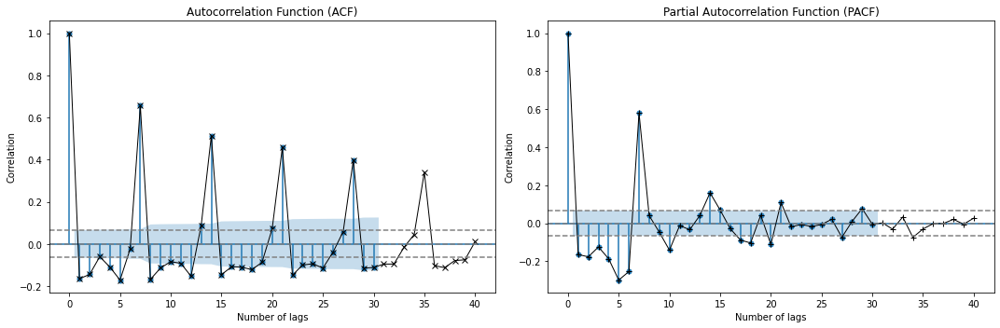

In [193]:
y=store_29_log['Sales']
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

#### Plot ACF and PACF to determine seasonal p and q values

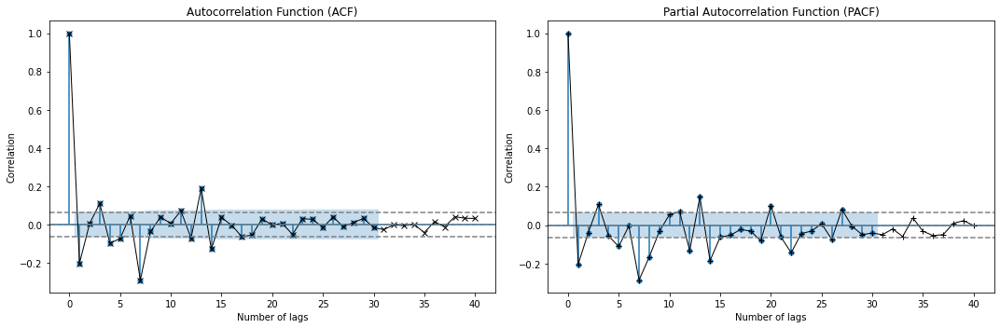

In [194]:
y=store_29_log['Sales'].diff(7).dropna() #store data is showing weekly trend
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

### Model 1: SARIMA Model for Store 29

In [195]:
sarima_model_29 = SARIMAX(train_29_log['Sales'], order=(1,1,1), seasonal_order=(1,1,1,7))
sarima_model_29_fit = sarima_model_29.fit()
print(sarima_model_29_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  737
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood               -1663.087
Date:                           Tue, 22 Feb 2022   AIC                           3336.173
Time:                                   14:35:01   BIC                           3359.132
Sample:                                        0   HQIC                          3345.031
                                           - 737                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1916      0.025     -7.626      0.000      -0.241      -0.142
ma.L1         -0.9999      0.538     -1.860

#### Recover original time series

In [196]:
y_hat_sarima_29 = store_29_log.copy()
y_hat_sarima_29['sarima_forecast_log'] = sarima_model_29_fit.predict(store_29_log.index.min(), len(store_29_log)-1).values
y_hat_sarima_29['sarima_forecast'] = np.exp(y_hat_sarima_29['sarima_forecast_log'])

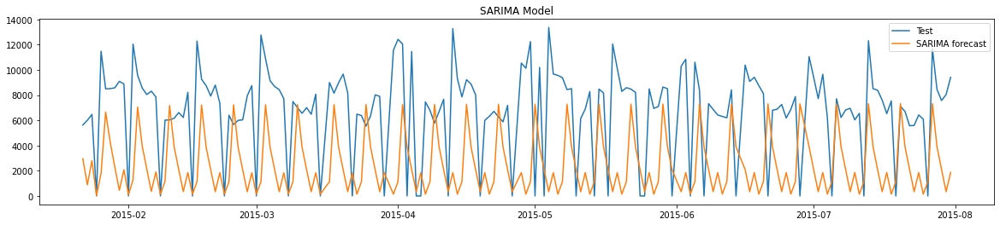

In [197]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_29['Sales'], label='Test')
plt.plot(y_hat_sarima_29['sarima_forecast'][test_29.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Forecasting for the next 6 weeks

In [198]:
# Create a series to forecast for the next 6 weeks.
six_weeks_range = pd.date_range(store_29_log.index.max(), periods=42)
num_of_days = len(train_29_log) + (pd.to_datetime(six_weeks_range[-1]) - train_29_log.index.max()).days - 1
date_range = pd.date_range(train_29_log.index.max(), six_weeks_range[-1])
six_week_forecast = pd.Series(sarima_model_29_fit.predict(train_29_log.index.max(), num_of_days).values, index=date_range)
six_week_forecast = np.exp(six_week_forecast)

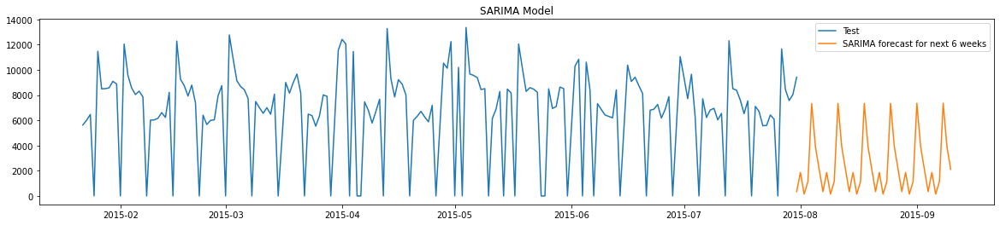

In [199]:
plt.figure(figsize=(20,4))
plt.plot(test_29['Sales'], label='Test')
plt.plot(six_week_forecast[test_29.index.max():], label='SARIMA forecast for next 6 weeks')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Model Evaluation

In [200]:
evaluate_model('29', 'SARIMA (1, 1, 1)x(1, 1, 1, 7)', test_29, y_hat_sarima_29['sarima_forecast'])

,Store ID,Model Type,RMSE,MAE
24,29,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",5887.04,5050.29


### Model 2: SARIMAX Model for Store 29
- To forecast for the next 6 weeks from the last date in dataset, exogenous variable data for the next 6 weeks should be available. Since this is not available, we will try to forecast the Sales within the available data.

In [201]:
# Using all variables as exogenious variables except for sales and customers
exog = train_29.drop(['Sales', 'Customers'], axis=1).columns
sarimax_model_29 = SARIMAX(train_29_log['Sales'], exog=train_29_log[exog], order=(1,1,1), seasonal_order=(1,1,1,7))
sarimax_model_29_fit = sarimax_model_29.fit()
print(sarimax_model_29_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  737
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood                 435.271
Date:                           Tue, 22 Feb 2022   AIC                           -836.541
Time:                                   14:35:12   BIC                           -758.483
Sample:                                        0   HQIC                          -806.424
                                           - 737                                         
Covariance Type:                             opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Open                   5.7538      0.035    162.840      0.000       5.685       5.823
Promo              

#### Recover original time series

In [202]:
y_hat_sarimax_29 = store_29_log.copy()
y_hat_sarimax_29['sarimax_forecast_log'] = sarimax_model_29_fit.predict(store_29_log.index.min(), len(store_29_log)-1, exog=test_29_log[exog]).values
y_hat_sarimax_29['sarimax_forecast'] = np.exp(y_hat_sarimax_29['sarimax_forecast_log'])

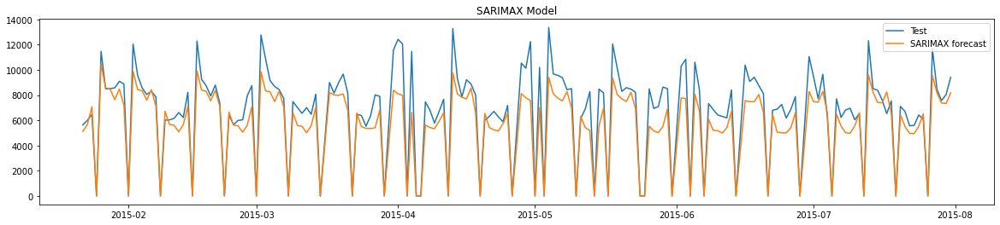

In [203]:
plt.figure(figsize=(20,4))
plt.plot(test_29['Sales'], label='Test')
plt.plot(y_hat_sarimax_29['sarimax_forecast'][test_29.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX Model')
plt.show()

#### Model Evaluation

In [204]:
evaluate_model('29', 'SARIMAX (1, 1, 1)x(1, 1, 1, 7)', test_29, y_hat_sarimax_29['sarimax_forecast'])

,Store ID,Model Type,RMSE,MAE
24,29,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",5887.04,5050.29
25,29,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",1513.57,1092.97


### Model 3: VAR Model for Store 29

In [205]:
# Check for cointegration. If time is cointegrated/stationary, then we can proceed with building VAR/VARMAX models.
cointegration_test(store_29_log)

Time series are stationary/cointegrated.


In [206]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VAR model
var_model_29 = sm.tsa.VARMAX(train_29_log[['Sales', 'Customers']].astype('float'), order=(1, 0))
var_model_29_fit = var_model_29.fit(maxiter=1000, disp=False)
var_model_29_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,737
Model:,VAR(1),Log Likelihood,-546.713
,+ intercept,AIC,1111.426
Date:,"Tue, 22 Feb 2022",BIC,1152.849
Time:,14:35:15,HQIC,1127.400
Sample:,0,,
,- 737,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"1.70, 0.38",Jarque-Bera (JB):,"309.49, 24.15"
Prob(Q):,"0.19, 0.54",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"1.10, 0.90",Skew:,"-1.54, -0.18"


#### Recover original time series

In [207]:
y_hat_var_29 = store_29_log.copy()
predictions = var_model_29_fit.predict(store_29_log.index.min(), len(store_29_log) - 1)
predictions['Date'] = store_29_log.index
predictions.set_index('Date', inplace=True)
y_hat_var_29[['Sales', 'Customers']] = predictions
y_hat_var_29[['Sales', 'Customers']] = np.exp(y_hat_var_29[['Sales', 'Customers']])

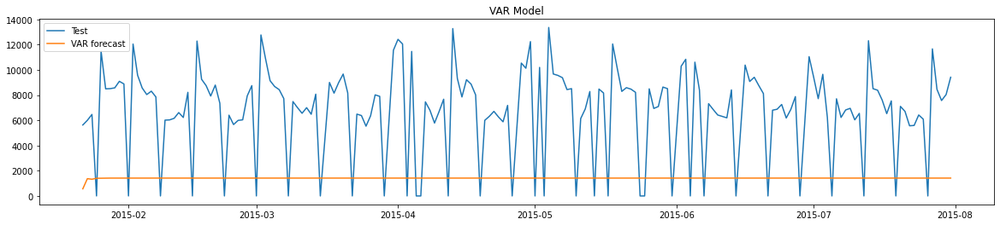

In [208]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_29['Sales'], label='Test')
plt.plot(y_hat_var_29['Sales'][test_29.index.min():], label='VAR forecast')
plt.legend(loc='upper left')
plt.title('VAR Model')
plt.show()

In [209]:
evaluate_model('29', 'VAR (1, 0)', test_29, y_hat_var_29['Sales'])

,Store ID,Model Type,RMSE,MAE
24,29,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",5887.04,5050.29
25,29,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",1513.57,1092.97
26,29,"VAR (1, 0)",6393.90,5826.94


### Model 4: VARMAX Model for Store 29

In [210]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VARMAX model
exog = train_29.drop(['Sales', 'Customers'], axis=1).columns
varmax_model_29 = sm.tsa.VARMAX(train_29_log[['Sales', 'Customers']].astype('float'), order=(1, 1), exog=train_29_log[exog])
varmax_model_29_fit = varmax_model_29.fit(maxiter=1000, disp=False)
varmax_model_29_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,737
Model:,"VARMAX(1,1)",Log Likelihood,1039.279
,+ intercept,AIC,-2004.557
Date:,"Tue, 22 Feb 2022",BIC,-1834.261
Time:,14:42:11,HQIC,-1938.885
Sample:,0,,
,- 737,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"47.74, 1.44",Jarque-Bera (JB):,"2061830.94, 36.63"
Prob(Q):,"0.00, 0.23",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"0.16, 0.82",Skew:,"-12.53, -0.24"


#### Recover original time series

In [211]:
y_hat_varmax_29 = store_29_log.copy()
predictions = varmax_model_29_fit.predict(store_29_log.index.min(), len(store_29_log) - 1, exog=test_29_log[exog])
predictions['Date'] = store_29_log.index
predictions.set_index('Date', inplace=True)
y_hat_varmax_29[['Sales', 'Customers']] = predictions
y_hat_varmax_29[['Sales', 'Customers']] = np.exp(y_hat_varmax_29[['Sales', 'Customers']])

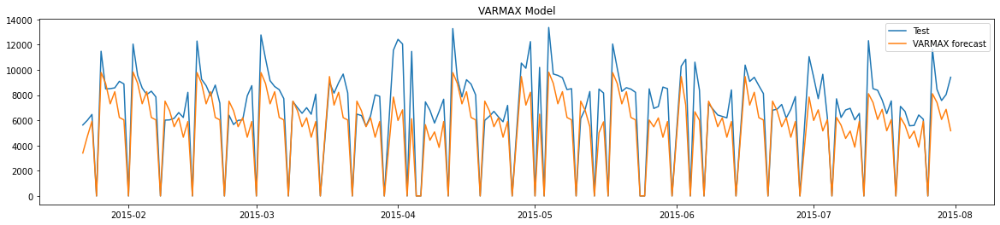

In [212]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_29['Sales'], label='Test')
plt.plot(y_hat_varmax_29['Sales'][test_29.index.min():], label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX Model')
plt.show()

In [213]:
evaluate_model('29', 'VARMAX (1, 1)', test_29, y_hat_varmax_29['Sales'])

,Store ID,Model Type,RMSE,MAE
24,29,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",5887.04,5050.29
25,29,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",1513.57,1092.97
26,29,"VAR (1, 0)",6393.90,5826.94
27,29,"VARMAX (1, 1)",1911.74,1408.20


**Observations:**
- SARIMAX model is better for store 29 series when compared to other 3 models.

# `Store 31` Time Series Analysis

In [214]:
# Remove columns having only 1 unique value. These columns don't have variance and won't contribute while modelling.
cols_to_remove = [col for col in store_31.columns if store_31[col].nunique() <= 1]
store_31.drop(cols_to_remove, inplace=True, axis=1)
store_31.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeekMon,DayOfWeekSat,DayOfWeekSun,DayOfWeekThu,DayOfWeekTue,DayOfWeekWed,StateHolidayEaster,StateHolidayNone,StateHolidayPublic
Date,,,,,,,,,,,,,,
2013-01-01,0,0,0,0,1,0,0,0,0,1,0,0,0,1
2013-01-02,5122,567,1,0,1,0,0,0,0,0,1,0,1,0
2013-01-03,5623,578,1,0,1,0,0,0,1,0,0,0,1,0
2013-01-04,6140,633,1,0,1,0,0,0,0,0,0,0,1,0
2013-01-05,5607,624,1,0,0,0,1,0,0,0,0,0,1,0


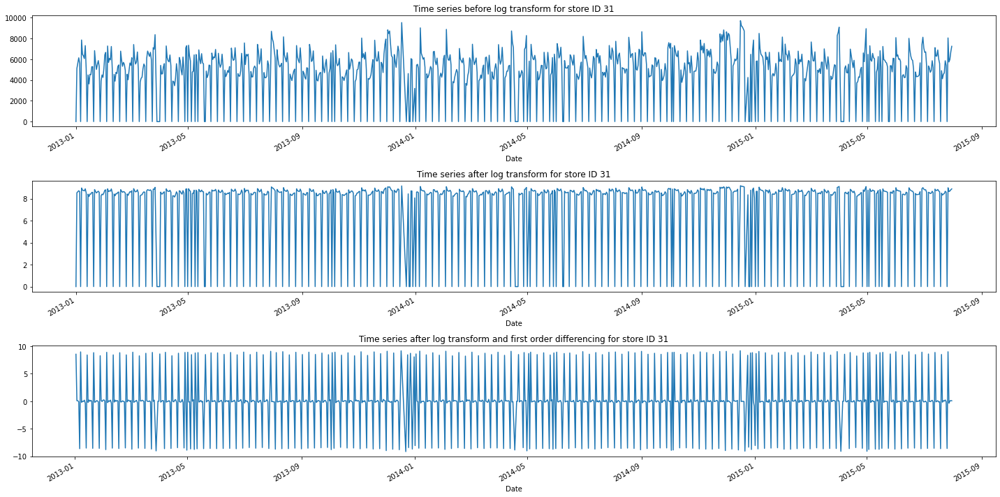

In [215]:
# Visualise the time series data for Store 31.
store_id = 31
store_31_log = data_log[data_log.Store == store_id]
store_31_log_diff = store_31_log.diff().dropna()

plt.figure(figsize=(20,10), tight_layout=True)
plt.subplot(311)
store_31['Sales'].plot()
plt.title(f'Time series before log transform for store ID {store_id}')

plt.subplot(312)
store_31_log['Sales'].plot()
plt.title(f'Time series after log transform for store ID {store_id}')

plt.subplot(313)
store_31_log_diff['Sales'].plot()
plt.title(f'Time series after log transform and first order differencing for store ID {store_id}')
plt.show()

**Observations:**
- The variance and mean is constant after performing log transform even without first order differencing.
- Let's test the stationarity of the series before performing log transform. If the series is not yet stationary, then let's do log transformtion followed by first order differencing.

In [216]:
get_stationarity_res(store_31[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,7.962729e-08,stationary,0.1,stationary
1,Customers,3.083439e-08,stationary,0.1,stationary


**Observations:**
- For this time series, the differencing and log transformation is not even required since the time series is already stationary.

#### Stratified train and test split datasets
- Split 80% train and 20% test data respectively.
- Differencing and transformation are not considered for store 31's time series data.

In [217]:
train_len = int(len(store_31) * 0.8)
train_31 = store_31[:train_len]
test_31 = store_31[train_len:]

train_31_log = store_31_log[:train_len]
test_31_log = store_31_log[train_len:]

#### Plot ACF and PACF to determine non-seasonal p and q values

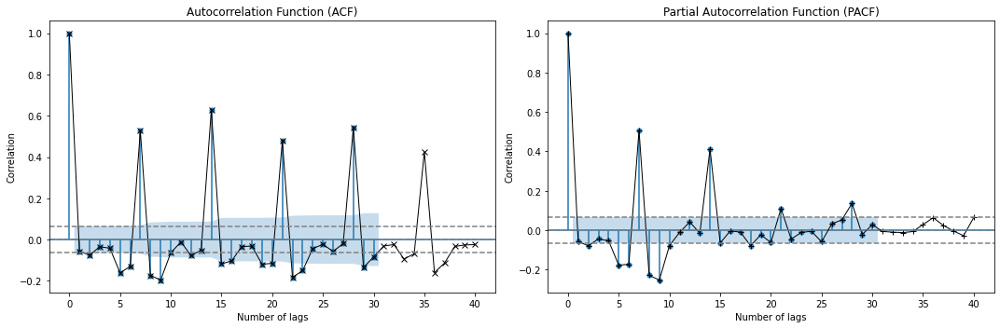

In [218]:
y=store_31['Sales']
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

#### Plot ACF and PACF to determine seasonal p and q values

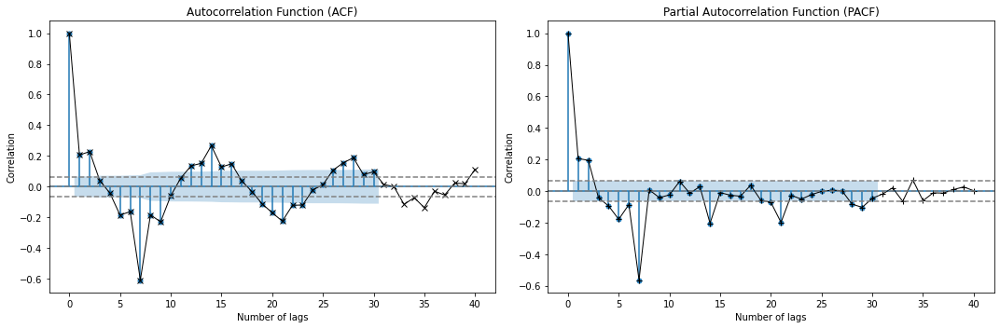

In [219]:
y=store_31['Sales'].diff(7).dropna() #store data is showing weekly trend
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

### Model 1: SARIMA Model for Store 31

In [220]:
sarima_model_31 = SARIMAX(train_31['Sales'], order=(1,0,1), seasonal_order=(2,1,2,7))
sarima_model_31_fit = sarima_model_31.fit()
print(sarima_model_31_fit.summary())

                                       SARIMAX Results                                        
Dep. Variable:                                  Sales   No. Observations:                  737
Model:             SARIMAX(1, 0, 1)x(2, 1, [1, 2], 7)   Log Likelihood               -6503.590
Date:                                Tue, 22 Feb 2022   AIC                          13021.181
Time:                                        14:42:20   BIC                          13053.332
Sample:                                             0   HQIC                         13033.585
                                                - 737                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9435      0.602     -1.566      0.117      -2.124       0.237
ma.

#### Recover original time series

In [221]:
y_hat_sarima_31 = store_31.copy()
y_hat_sarima_31['sarima_forecast'] = sarima_model_31_fit.predict(store_31.index.min(), len(store_31)-1).values

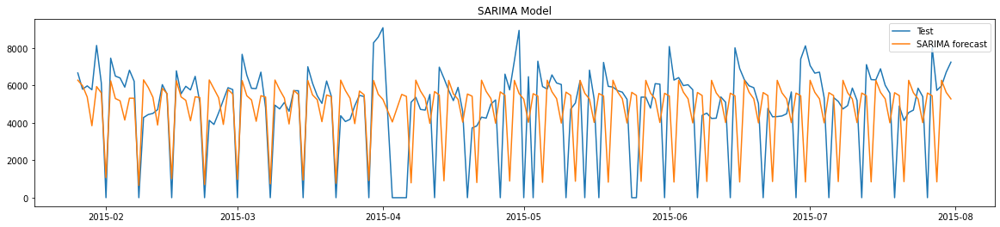

In [222]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_31['Sales'], label='Test')
plt.plot(y_hat_sarima_31['sarima_forecast'][test_31.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Forecasting for the next 6 weeks

In [223]:
# Create a series to forecast for the next 6 weeks.
six_weeks_range = pd.date_range(store_31.index.max(), periods=42)
num_of_days = len(train_31) + (pd.to_datetime(six_weeks_range[-1]) - train_31.index.max()).days - 1
date_range = pd.date_range(train_31.index.max(), six_weeks_range[-1])
six_week_forecast = pd.Series(sarima_model_31_fit.predict(train_31.index.max(), num_of_days).values, index=date_range)

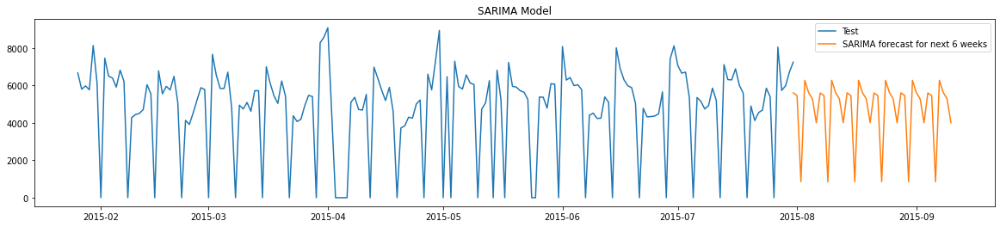

In [224]:
plt.figure(figsize=(20,4))
plt.plot(test_31['Sales'], label='Test')
plt.plot(six_week_forecast[test_31.index.max():], label='SARIMA forecast for next 6 weeks')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Model Evaluation

In [225]:
evaluate_model('31', 'SARIMA (1, 0, 1)x(2, 1, 2, 7)', test_31, y_hat_sarima_31['sarima_forecast'])

,Store ID,Model Type,RMSE,MAE
28,31,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2659.78,1931.3


### Model 2: SARIMAX Model for Store 31
- To forecast for the next 6 weeks from the last date in dataset, exogenous variable data for the next 6 weeks should be available. Since this is not available, we will try to forecast the Sales within the available data.

In [226]:
# Using all variables as exogenious variables except for sales and customers
exog = train_31.drop(['Sales', 'Customers'], axis=1).columns
sarimax_model_31 = SARIMAX(train_31['Sales'], exog=train_31[exog], order=(1,0,1), seasonal_order=(2,1,2,7))
sarimax_model_31_fit = sarimax_model_31.fit()
print(sarimax_model_31_fit.summary())

                                       SARIMAX Results                                        
Dep. Variable:                                  Sales   No. Observations:                  737
Model:             SARIMAX(1, 0, 1)x(2, 1, [1, 2], 7)   Log Likelihood               -5812.340
Date:                                Tue, 22 Feb 2022   AIC                          11662.680
Time:                                        14:42:37   BIC                          11749.948
Sample:                                             0   HQIC                         11696.349
                                                - 737                                         
Covariance Type:                                  opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Open                3940.8007    153.746     25.632      0.000    

#### Recover original time series

In [227]:
y_hat_sarimax_31 = store_31.copy()
y_hat_sarimax_31['sarimax_forecast'] = sarimax_model_31_fit.predict(store_31.index.min(), len(store_31)-1, exog=test_31[exog]).values

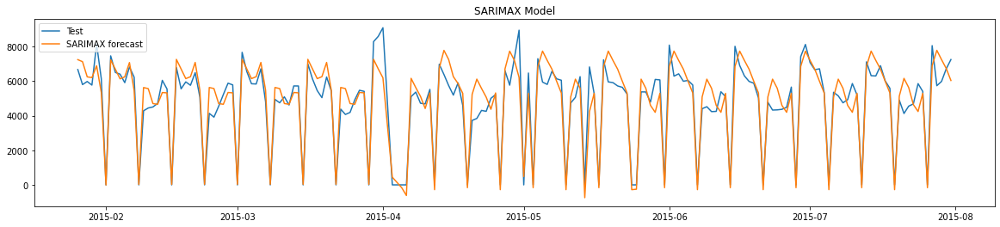

In [228]:
plt.figure(figsize=(20,4))
plt.plot(test_31['Sales'], label='Test')
plt.plot(y_hat_sarimax_31['sarimax_forecast'][test_31.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX Model')
plt.show()

#### Model Evaluation

In [229]:
evaluate_model('31', 'SARIMAX (1, 0, 1)x(2, 1, 2, 7)', test_31, y_hat_sarimax_31['sarimax_forecast'])

,Store ID,Model Type,RMSE,MAE
28,31,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2659.78,1931.30
29,31,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",878.44,643.34


### Model 31: VAR Model for Store 31

In [230]:
# Check for cointegration. If time is cointegrated/stationary, then we can proceed with building VAR/VARMAX models.
cointegration_test(store_31)

Time series are stationary/cointegrated.


In [231]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VAR model
var_model_31 = sm.tsa.VARMAX(train_31[['Sales', 'Customers']].astype('float'), order=(1, 0))
var_model_31_fit = var_model_31.fit(maxiter=1000, disp=False)
var_model_31_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,737
Model:,VAR(1),Log Likelihood,-10509.938
,+ intercept,AIC,21037.875
Date:,"Tue, 22 Feb 2022",BIC,21079.299
Time:,14:42:39,HQIC,21053.850
Sample:,0,,
,- 737,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.00, 5.98",Jarque-Bera (JB):,"158.70, 20.46"
Prob(Q):,"0.98, 0.01",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"1.08, 0.96",Skew:,"-1.12, -0.27"


#### Recover original time series

In [232]:
y_hat_var_31 = store_31.copy()
predictions = var_model_31_fit.predict(store_31.index.min(), len(store_31) - 1)
predictions['Date'] = store_31.index
predictions.set_index('Date', inplace=True)
y_hat_var_31[['Sales', 'Customers']] = predictions

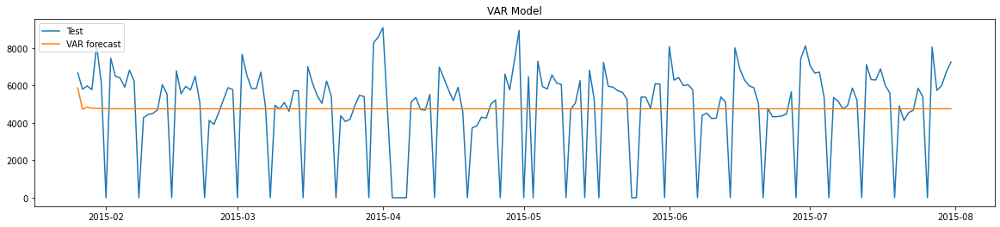

In [233]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_31['Sales'], label='Test')
plt.plot(y_hat_var_31['Sales'][test_31.index.min():], label='VAR forecast')
plt.legend(loc='upper left')
plt.title('VAR Model')
plt.show()

In [234]:
evaluate_model('31', 'VAR (1, 0)', test_31, y_hat_var_31['Sales'])

,Store ID,Model Type,RMSE,MAE
28,31,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2659.78,1931.30
29,31,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",878.44,643.34
30,31,"VAR (1, 0)",2367.37,1758.41


### Model 4: VARMAX Model for Store 31

In [235]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VARMAX model
exog = train_31.drop(['Sales', 'Customers'], axis=1).columns
varmax_model_31 = sm.tsa.VARMAX(train_31[['Sales', 'Customers']].astype('float'), order=(1, 1), exog=train_31[exog])
varmax_model_31_fit = varmax_model_31.fit(maxiter=1000, disp=False)
varmax_model_31_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,737
Model:,"VARMAX(1,1)",Log Likelihood,-9929.855
,+ intercept,AIC,19933.710
Date:,"Tue, 22 Feb 2022",BIC,20104.006
Time:,14:49:32,HQIC,19999.382
Sample:,0,,
,- 737,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.21, 1.86",Jarque-Bera (JB):,"48.90, 109.21"
Prob(Q):,"0.65, 0.17",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"1.23, 0.75",Skew:,"0.50, -0.16"


#### Recover original time series

In [236]:
y_hat_varmax_31 = store_31.copy()
predictions = varmax_model_31_fit.predict(store_31.index.min(), len(store_31) - 1, exog=test_31[exog])
predictions['Date'] = store_31.index
predictions.set_index('Date', inplace=True)
y_hat_varmax_31[['Sales', 'Customers']] = predictions

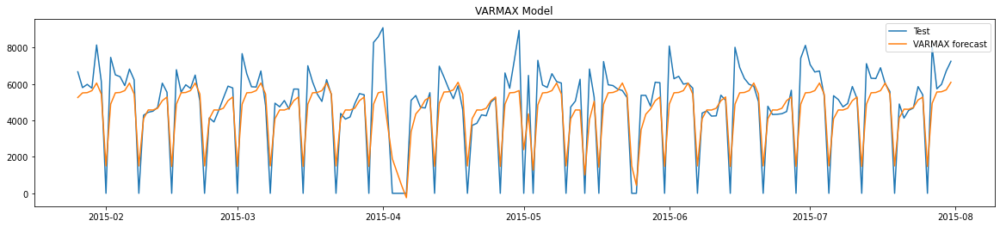

In [237]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_31['Sales'], label='Test')
plt.plot(y_hat_varmax_31['Sales'][test_31.index.min():], label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX Model')
plt.show()

In [238]:
evaluate_model('31', 'VARMAX (1, 1)', test_31, y_hat_varmax_31['Sales'])

,Store ID,Model Type,RMSE,MAE
28,31,"SARIMA (1, 0, 1)x(2, 1, 2, 7)",2659.78,1931.30
29,31,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",878.44,643.34
30,31,"VAR (1, 0)",2367.37,1758.41
31,31,"VARMAX (1, 1)",1208.58,892.15


**Observations:**
- SARIMAX model is better for store 31 series when compared to other 3 models.

# `Store 46` Time Series Analysis

In [239]:
# Remove columns having only 1 unique value. These columns don't have variance and won't contribute while modelling.
cols_to_remove = [col for col in store_46.columns if store_46[col].nunique() <= 1]
store_46.drop(cols_to_remove, inplace=True, axis=1)
store_46.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeekMon,DayOfWeekSat,DayOfWeekSun,DayOfWeekThu,DayOfWeekTue,DayOfWeekWed,StateHolidayEaster,StateHolidayNone,StateHolidayPublic
Date,,,,,,,,,,,,,,
2013-01-01,0,0,0,0,1,0,0,0,0,1,0,0,0,1
2013-01-02,4016,582,1,0,1,0,0,0,0,0,1,0,1,0
2013-01-03,4177,553,1,0,1,0,0,0,1,0,0,0,1,0
2013-01-04,4125,569,1,0,1,0,0,0,0,0,0,0,1,0
2013-01-05,4848,651,1,0,0,0,1,0,0,0,0,0,1,0


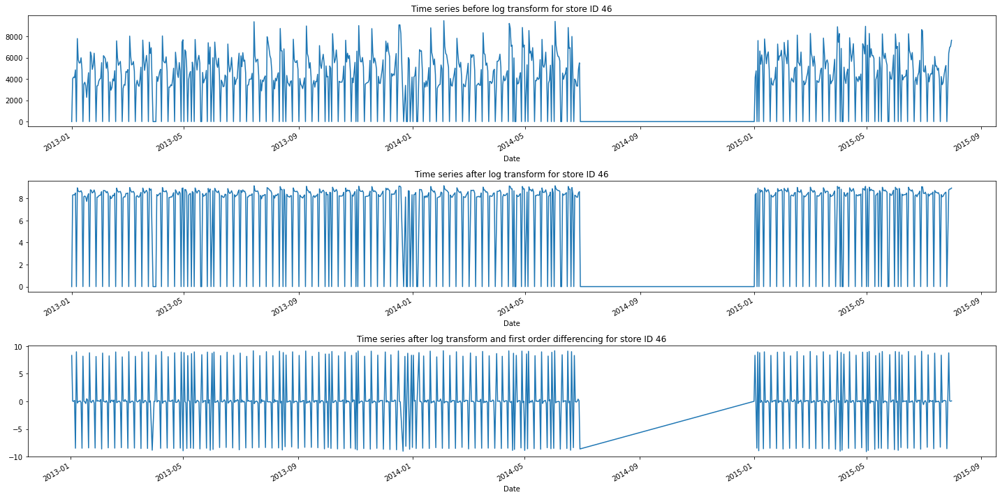

In [240]:
# Visualise the time series data for Store 46.
store_id = 46
store_46_log = data_log[data_log.Store == store_id]
store_46_log_diff = store_46_log.diff().dropna()

plt.figure(figsize=(20,10), tight_layout=True)
plt.subplot(311)
store_46['Sales'].plot()
plt.title(f'Time series before log transform for store ID {store_id}')

plt.subplot(312)
store_46_log['Sales'].plot()
plt.title(f'Time series after log transform for store ID {store_id}')

plt.subplot(313)
store_46_log_diff['Sales'].plot()
plt.title(f'Time series after log transform and first order differencing for store ID {store_id}')
plt.show()

**Observations:**
- The variance and mean is constant after performing log transform even without first order differencing.
- Let's test the stationarity of the series after performing log transform. If the series is not yet stationary, then let's do first order differencing.

In [241]:
get_stationarity_res(store_46[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,2.795566e-07,stationary,0.030538,not stationary
1,Customers,1.105082e-07,stationary,0.100000,stationary


In [242]:
get_stationarity_res(store_46_log[['Sales', 'Customers']])

,Column,ADF p-value,ADF Result,KPSS p-value,KPSS Result
0,Sales,8.793052e-07,stationary,0.1,stationary
1,Customers,8.255689e-07,stationary,0.1,stationary


**Observations:**
- After applying log transform, the time series is stationary. The differencing is not required for this series.

#### Stratified train and test split datasets
- Split 80% train and 20% test data respectively.
- Differencing is not considered for store 46's time series data.

In [243]:
train_len = int(len(store_46) * 0.8)
train_46 = store_46[:train_len]
test_46 = store_46[train_len:]

train_46_log = store_46_log[:train_len]
test_46_log = store_46_log[train_len:]

#### Plot ACF and PACF to determine non-seasonal p and q values

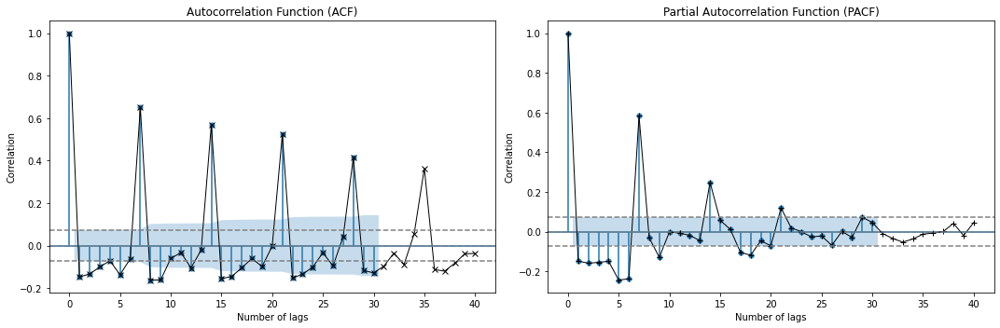

In [244]:
y=store_46_log['Sales']
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

#### Plot ACF and PACF to determine seasonal p and q values

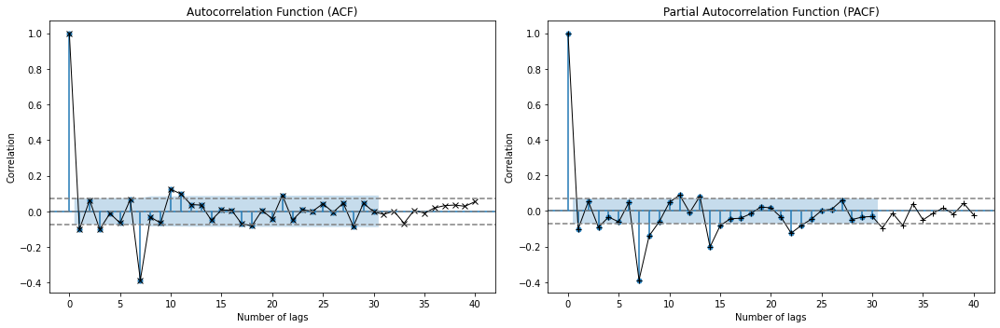

In [245]:
y=store_46_log['Sales'].diff(7).dropna() #store data is showing weekly trend
plt.figure(figsize=(15, 5))

# Plot ACF
plt.subplot(121)
plot_acf(y, ax=plt.gca(), lags = 30)
plt.plot(acf(y), marker='x', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')


# Plot PACF
plt.subplot(122)
plot_pacf(y, ax=plt.gca(), lags = 30)
plt.plot(pacf(y), marker='+', color='black', lw=1)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(y)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Number of lags')
plt.ylabel('Correlation')

plt.tight_layout()
plt.show()

### Model 1: SARIMA Model for Store 46

In [246]:
sarima_model_46 = SARIMAX(train_46_log['Sales'], order=(1,1,1), seasonal_order=(1,1,1,7))
sarima_model_46_fit = sarima_model_46.fit()
print(sarima_model_46_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  593
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood               -1367.418
Date:                           Tue, 22 Feb 2022   AIC                           2744.836
Time:                                   14:49:37   BIC                           2766.694
Sample:                                        0   HQIC                          2753.354
                                           - 593                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1333      0.026     -5.117      0.000      -0.184      -0.082
ma.L1         -0.9999      0.327     -3.056

#### Recover original time series

In [247]:
y_hat_sarima_46 = store_46_log.copy()
y_hat_sarima_46['sarima_forecast_log'] = sarima_model_46_fit.predict(store_46_log.index.min(), len(store_46_log)-1).values
y_hat_sarima_46['sarima_forecast'] = np.exp(y_hat_sarima_46['sarima_forecast_log'])

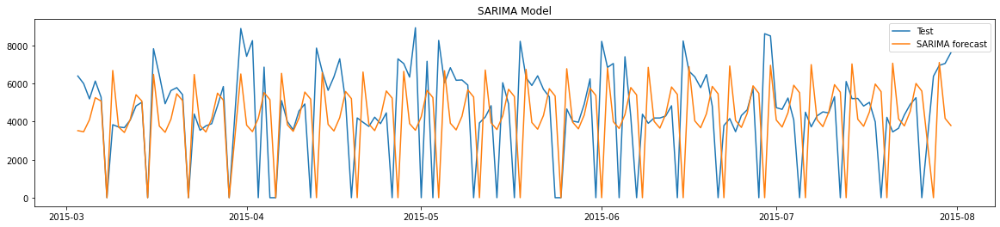

In [248]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_46['Sales'], label='Test')
plt.plot(y_hat_sarima_46['sarima_forecast'][test_46.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Forecasting for the next 6 weeks

In [249]:
# Create a series to forecast for the next 6 weeks.
six_weeks_range = pd.date_range(store_46_log.index.max(), periods=42)
num_of_days = len(train_46_log) + (pd.to_datetime(six_weeks_range[-1]) - train_46_log.index.max()).days - 1
date_range = pd.date_range(train_46_log.index.max(), six_weeks_range[-1])
six_week_forecast = pd.Series(sarima_model_46_fit.predict(train_46_log.index.max(), num_of_days).values, index=date_range)
six_week_forecast = np.exp(six_week_forecast)

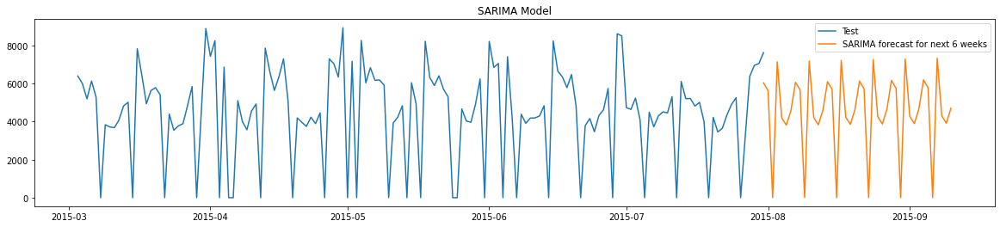

In [250]:
plt.figure(figsize=(20,4))
plt.plot(test_46['Sales'], label='Test')
plt.plot(six_week_forecast[test_46.index.max():], label='SARIMA forecast for next 6 weeks')
plt.legend(loc='best')
plt.title('SARIMA Model')
plt.show()

#### Model Evaluation

In [251]:
evaluate_model('46', 'SARIMA (1, 1, 1)x(1, 1, 1, 7)', test_46, y_hat_sarima_46['sarima_forecast'])

,Store ID,Model Type,RMSE,MAE
32,46,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",3199.22,2291.48


### Model 2: SARIMAX Model for Store 46
- To forecast for the next 6 weeks from the last date in dataset, exogenous variable data for the next 6 weeks should be available. Since this is not available, we will try to forecast the Sales within the available data.

In [252]:
# Using all variables as exogenious variables except for sales and customers
exog = train_46.drop(['Sales', 'Customers'], axis=1).columns
sarimax_model_46 = SARIMAX(train_46_log['Sales'], exog=train_46_log[exog], order=(1,1,1), seasonal_order=(1,1,1,7))
sarimax_model_46_fit = sarimax_model_46.fit()
print(sarimax_model_46_fit.summary())

                                     SARIMAX Results                                     
Dep. Variable:                             Sales   No. Observations:                  593
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood                 404.338
Date:                           Tue, 22 Feb 2022   AIC                           -774.676
Time:                                   14:49:44   BIC                           -700.359
Sample:                                        0   HQIC                          -745.713
                                           - 593                                         
Covariance Type:                             opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Open                   8.4957      0.179     47.383      0.000       8.144       8.847
Promo              

#### Recover original time series

In [253]:
y_hat_sarimax_46 = store_46_log.copy()
y_hat_sarimax_46['sarimax_forecast_log'] = sarimax_model_46_fit.predict(store_46_log.index.min(), len(store_46_log)-1, exog=test_46_log[exog]).values
y_hat_sarimax_46['sarimax_forecast'] = np.exp(y_hat_sarimax_46['sarimax_forecast_log'])

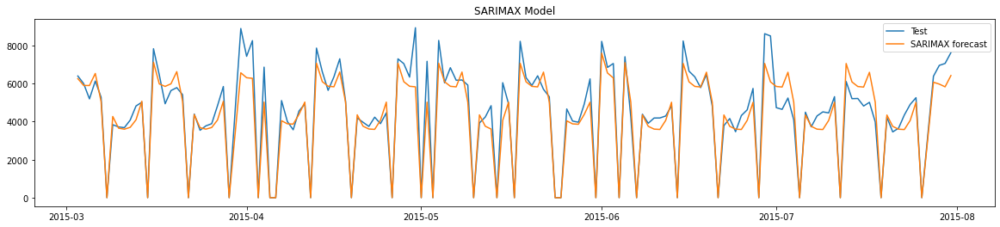

In [254]:
plt.figure(figsize=(20,4))
plt.plot(test_46['Sales'], label='Test')
plt.plot(y_hat_sarimax_46['sarimax_forecast'][test_46.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX Model')
plt.show()

#### Model Evaluation

In [255]:
evaluate_model('46', 'SARIMAX (1, 1, 1)x(1, 1, 1, 7)', test_46, y_hat_sarimax_46['sarimax_forecast'])

,Store ID,Model Type,RMSE,MAE
32,46,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",3199.22,2291.48
33,46,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",762.02,516.70


### Model 3: VAR Model for Store 46

In [256]:
# Check for cointegration. If time is cointegrated/stationary, then we can proceed with building VAR/VARMAX models.
cointegration_test(store_46_log)

Time series are stationary/cointegrated.


In [257]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VAR model
var_model_46 = sm.tsa.VARMAX(train_46_log[['Sales', 'Customers']].astype('float'), order=(1, 0))
var_model_46_fit = var_model_46.fit(maxiter=1000, disp=False)
var_model_46_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,593
Model:,VAR(1),Log Likelihood,-598.614
,+ intercept,AIC,1215.227
Date:,"Tue, 22 Feb 2022",BIC,1254.694
Time:,14:49:47,HQIC,1230.599
Sample:,0,,
,- 593,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"0.01, 2.73",Jarque-Bera (JB):,"139.56, 3.79"
Prob(Q):,"0.93, 0.10",Prob(JB):,"0.00, 0.15"
Heteroskedasticity (H):,"1.07, 1.38",Skew:,"-1.17, 0.08"


#### Recover original time series

In [258]:
y_hat_var_46 = store_46_log.copy()
predictions = var_model_46_fit.predict(store_46_log.index.min(), len(store_46_log) - 1)
predictions['Date'] = store_46_log.index
predictions.set_index('Date', inplace=True)
y_hat_var_46[['Sales', 'Customers']] = predictions
y_hat_var_46[['Sales', 'Customers']] = np.exp(y_hat_var_46[['Sales', 'Customers']])

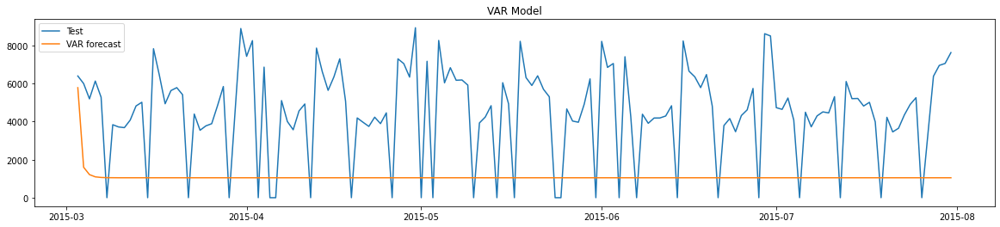

In [259]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_46['Sales'], label='Test')
plt.plot(y_hat_var_46['Sales'][test_46.index.min():], label='VAR forecast')
plt.legend(loc='upper left')
plt.title('VAR Model')
plt.show()

In [260]:
evaluate_model('46', 'VAR (1, 0)', test_46, y_hat_var_46['Sales'])

,Store ID,Model Type,RMSE,MAE
32,46,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",3199.22,2291.48
33,46,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",762.02,516.70
34,46,"VAR (1, 0)",4186.11,3765.99


### Model 4: VARMAX Model for Store 46

In [261]:
# Since both Sales and Customers series are stationary/cointegrated, we can build a multivariate time series model - VARMAX model
exog = train_46.drop(['Sales', 'Customers'], axis=1).columns
varmax_model_46 = sm.tsa.VARMAX(train_46_log[['Sales', 'Customers']].astype('float'), order=(1, 1), exog=train_46_log[exog])
varmax_model_46_fit = varmax_model_46.fit(maxiter=1000, disp=False)
varmax_model_46_fit.summary()

Dep. Variable:,"['Sales', 'Customers']",No. Observations:,593
Model:,"VARMAX(1,1)",Log Likelihood,860.402
,+ intercept,AIC,-1646.804
Date:,"Tue, 22 Feb 2022",BIC,-1484.552
Time:,14:55:24,HQIC,-1583.609
Sample:,0,,
,- 593,,
Covariance Type:,opg,,
Ljung-Box (L1) (Q):,"43.30, 1.28",Jarque-Bera (JB):,"2504593.47, 32.19"
Prob(Q):,"0.00, 0.26",Prob(JB):,"0.00, 0.00"
Heteroskedasticity (H):,"0.08, 1.45",Skew:,"-15.43, 0.21"


#### Recover original time series

In [262]:
y_hat_varmax_46 = store_46_log.copy()
predictions = varmax_model_46_fit.predict(store_46_log.index.min(), len(store_46_log) - 1, exog=test_46_log[exog])
predictions['Date'] = store_46_log.index
predictions.set_index('Date', inplace=True)
y_hat_varmax_46[['Sales', 'Customers']] = predictions
y_hat_varmax_46[['Sales', 'Customers']] = np.exp(y_hat_varmax_46[['Sales', 'Customers']])

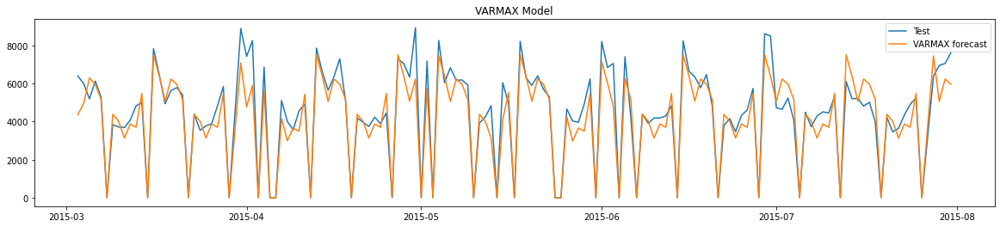

In [263]:
# Check the model performance w.r.t test dataset.
plt.figure(figsize=(20,4))
plt.plot(test_46['Sales'], label='Test')
plt.plot(y_hat_varmax_46['Sales'][test_46.index.min():], label='VARMAX forecast')
plt.legend(loc='best')
plt.title('VARMAX Model')
plt.show()

In [264]:
evaluate_model('46', 'VARMAX (1, 1)', test_46, y_hat_varmax_46['Sales'])

,Store ID,Model Type,RMSE,MAE
32,46,"SARIMA (1, 1, 1)x(1, 1, 1, 7)",3199.22,2291.48
33,46,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",762.02,516.70
34,46,"VAR (1, 0)",4186.11,3765.99
35,46,"VARMAX (1, 1)",861.34,604.64


**Observations:**
- SARIMAX model is better for store 46 series when compared to other 3 models.

### Final Observations
- Performed stratified train-test split to create train and test datasets individually for every store.
- For every store, 4 models are built - SARIMA, SARIMAX, VAR, and VARMAX which totals to 36 models for all 9 stores.
- Below data frame shows the best model for every time series data for all 9 stores selected.
- (p, d, q)x(P, D, Q, S): The parameters after the model name indicates the non-seasonal and seasonal parameters.
- Choosing the best model based on the least RMSE value.

In [265]:
rmse = model_eval_df.groupby('Store ID').min()['RMSE'].values
selected_models = model_eval_df[model_eval_df['RMSE'].isin(rmse)]
selected_models.reset_index(inplace=True)
selected_models.drop(['index'], axis=1, inplace=True)
selected_models

,Store ID,Model Type,RMSE,MAE
0,1,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",577.33,390.19
1,3,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",988.78,798.15
2,8,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",978.89,695.95
3,9,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",742.33,519.14
4,13,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",870.80,632.74
5,25,"SARIMAX (2, 0, 2)x(2, 1, 2, 7)",1540.81,1001.18
6,29,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",1513.57,1092.97
7,31,"SARIMAX (1, 0, 1)x(2, 1, 2, 7)",878.44,643.34
8,46,"SARIMAX (1, 1, 1)x(1, 1, 1, 7)",762.02,516.70
